In [4]:
#Load libraries
import pandas as pd
import numpy as np # linear algebra
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline
import warnings,scipy
warnings.filterwarnings("ignore")
import scipy.stats as stats
from scipy.special import boxcox1p, boxcox
import scipy.stats as stats 
import statsmodels.api as sm
pd.set_option('display.max_rows', None, 'display.max_columns', None)

In [5]:
#Load Data
df=pd.read_csv('loan.csv')

In [31]:
df.head(2)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.0,0.0,5863.155187,5833.84,5000.00,863.16,0.0,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.0,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [7]:
df.shape

(39717, 111)

In [8]:
#Data Check
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [9]:
df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,14035.000000,2786.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39661.0,0.0,39717.0,0.0,0.0,0.0,39717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39661.0,39717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,35.900962,69.698134,9.294408,0.055065,13382.528086,22.088828,51.227887,50.989768,12153.596544,11567.149118,9793.348813,2263.663172,1.363015,95.221624,12.406112,2678.826162,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,22.020060,43.822529,4.400282,0.237200,15885.016641,11.401709,375.172839,373.824457,9042.040766,8942.672613,7065.522127,2608.111964,7.289979,688.744771,148.671593,4447.136012,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,18.000000,22.000000,6.000000,0.000000,3703.000000,13.000000,0.000000,0.000000,5576.930000,5112.310000,4600.000000,662.180000,0.000000,0.000000,0.000000,218.680000,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [33]:
df.loan_amnt.isnull().sum()

0

In [12]:
#Data Cleansing : Missing value treatement
nulls = pd.DataFrame((df.isnull().sum()/len(df.index)*100),columns=['null_percent'])
null=nulls.sort_values('null_percent',ascending=False)
df2 = pd.DataFrame(index=nulls.index.copy())
df2[['null_percent']]=nulls[['null_percent']]
df2.sort_values(['null_percent'],ascending=False)

,null_percent
verification_status_joint,100.000000
annual_inc_joint,100.000000
mo_sin_old_rev_tl_op,100.000000
mo_sin_old_il_acct,100.000000
bc_util,100.000000
bc_open_to_buy,100.000000
avg_cur_bal,100.000000
acc_open_past_24mths,100.000000
inq_last_12m,100.000000
total_cu_tl,100.000000


In [13]:
df['loan_status'].value_counts(dropna=False)

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

In [22]:
# How can  we divide the loan_status segment to default and non default
# Binary 0 or 1 
#Multiclass D - ND - Late
lloans=df

In [23]:
#missing_fractions = lloans.isnull().mean().sort_values(ascending=False)

In [24]:
#drop_list = sorted(list(missing_fractions[missing_fractions > 0.7].index))

In [25]:
#print(len(drop_list))

In [18]:
#lloans=df.drop(labels=drop_list, axis=1)

In [27]:
#print(lloans.shape)

In [28]:
lloans=df

In [29]:
lloans['il_util'].head()

0   NaN
1   NaN
2   NaN
3   NaN
4   NaN
Name: il_util, dtype: float64

<AxesSubplot:xlabel='il_util'>

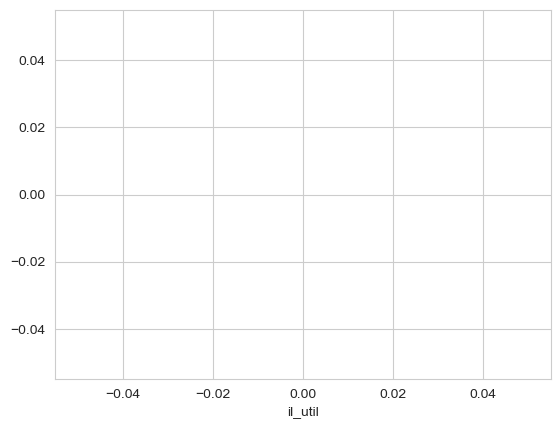

In [30]:
sns.distplot(lloans['il_util'])

In [35]:
lloans['il_util'].isna().sum()

39717

In [36]:
lloans['il_util'].fillna(lloans['il_util'].median(),inplace=True)

In [37]:
lloans['il_util'].isna().sum()

39717

<AxesSubplot:xlabel='il_util'>

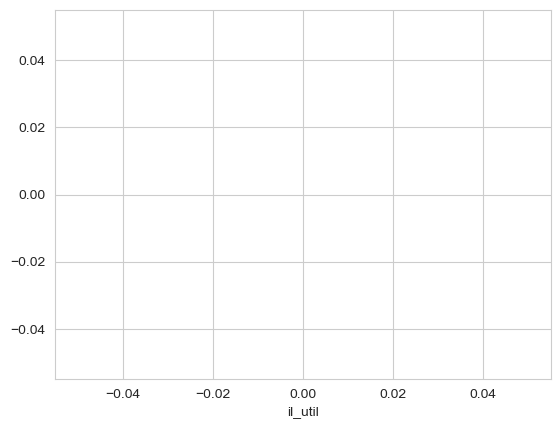

In [38]:
sns.distplot(lloans['il_util'])

In [39]:
lloans.emp_title.value_counts()

US Army                                                                           134
Bank of America                                                                   109
IBM                                                                                66
AT&T                                                                               59
Kaiser Permanente                                                                  56
Wells Fargo                                                                        54
USAF                                                                               54
UPS                                                                                53
US Air Force                                                                       52
Walmart                                                                            45
Lockheed Martin                                                                    44
United States Air Force                               

In [40]:
lloans['emp_title'].fillna("Missing",inplace=True)

In [41]:
lloans['emp_title'].isna().sum()

0

In [42]:
nulls = pd.DataFrame(round(lloans.isnull().sum()/len(lloans.index)*100,2),columns=['null_percent'])
null=nulls.sort_values('null_percent',ascending=False)
df2 = pd.DataFrame(index=nulls.index.copy())
df2[['null_percent']]=nulls[['null_percent']]
df2.sort_values(['null_percent'],ascending=False)

,null_percent
verification_status_joint,100.00
annual_inc_joint,100.00
mo_sin_old_rev_tl_op,100.00
mo_sin_old_il_acct,100.00
bc_util,100.00
bc_open_to_buy,100.00
avg_cur_bal,100.00
acc_open_past_24mths,100.00
inq_last_12m,100.00
total_cu_tl,100.00


In [43]:
loann=lloans

In [44]:
#Drop constant features
def find_constant_features(dataFrame):
    const_features = []
    for column in list(dataFrame.columns):
        if dataFrame[column].unique().size < 2:
            const_features.append(column)
    return const_features

const_features = find_constant_features(loann)
print(const_features)

['pymnt_plan', 'initial_list_status', 'mths_since_last_major_derog', 'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'delinq_amnt', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_d

In [45]:
loann.policy_code.value_counts()

1    39717
Name: policy_code, dtype: int64

In [46]:
loann.drop('policy_code',axis=1,inplace=True)

In [47]:
loann.shape

(39717, 110)

In [48]:
#Defining target variable
bad_loan = ["Charged Off", "Default", "Does not meet the credit policy. Status:Charged Off", "In Grace Period", 
            "Late (16-30 days)", "Late (31-120 days)"]


loann['loan_condition'] = np.nan

def loan_condition(status):
    if status in bad_loan:
        return 'Bad Loan'
    else:
        return 'Good Loan'
    
    
loann['loan_condition'] = loann['loan_status'].apply(loan_condition)

In [49]:
loann['loan_condition'].value_counts()

Good Loan    34090
Bad Loan      5627
Name: loan_condition, dtype: int64

In [50]:
loann['loan_condition'].value_counts(normalize=True)

Good Loan    0.858323
Bad Loan     0.141677
Name: loan_condition, dtype: float64

In [51]:
loann.shape

(39717, 111)

In [52]:
#Drop duplicate records
loann.drop_duplicates(inplace= True)
#keep = last or first

In [53]:
loann.shape

(39717, 111)

In [54]:
data=loann

In [55]:
#Correlation analysis
corr=data.corr()
index=[]
column=[]
value=[]
for i in range(len(corr.index)):
   for j in range(len(corr.index)):
       #if corr.iloc[i,j] > 0.75  and corr.iloc[i,j] != 1:
        if corr.iloc[i,j] !=1:
           column.append(corr.columns[i])
           index.append(corr.index[j])
           value.append((corr.iloc[i,j]))
           

In [56]:
corr.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
id,1.000000,0.993650,0.141919,0.152286,0.249547,0.086587,0.008731,0.095983,-0.008644,-0.042378,0.117193,0.702130,0.020388,-0.019440,0.008763,0.042149,0.180619,0.180591,0.140045,0.220838,0.112213,0.172856,-0.055082,0.033426,-0.013359,0.122365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009505,NaN,NaN,NaN,NaN,NaN
member_id,0.993650,1.000000,0.140710,0.150322,0.257887,0.081025,0.009380,0.096963,-0.008119,-0.047086,0.122963,0.719538,0.017928,-0.018721,0.005113,0.044374,0.170743,0.170706,0.139975,0.229307,0.112168,0.173234,-0.057750,0.031565,-0.015155,0.123627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.008769,NaN,NaN,NaN,NaN,NaN
loan_amnt,0.141919,0.140710,1.000000,0.981578,0.940034,0.930288,0.271149,0.066439,-0.031864,0.009229,0.014871,0.004968,0.177168,-0.051236,0.317597,0.256442,0.192937,0.192623,0.886613,0.854243,0.852021,0.729726,0.044706,0.135446,0.072853,0.448742,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.037180,NaN,NaN,NaN,NaN,NaN
funded_amnt,0.152286,0.150322,0.981578,1.000000,0.958422,0.956159,0.266965,0.066283,-0.032355,0.009259,0.016359,-0.006059,0.175530,-0.052169,0.310392,0.250589,0.194941,0.194675,0.903160,0.870799,0.870255,0.737469,0.046705,0.136284,0.074676,0.453133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.038502,NaN,NaN,NaN,NaN,NaN
funded_amnt_inv,0.249547,0.257887,0.940034,0.958422,1.000000,0.905039,0.254375,0.074689,-0.038501,-0.005712,0.071924,0.437906,0.163027,-0.053214,0.290797,0.242854,0.203688,0.203693,0.881228,0.913257,0.845848,0.730914,0.027172,0.123759,0.060358,0.442604,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.042746,NaN,NaN,NaN,NaN,NaN


In [57]:
correlation=pd.DataFrame({'columns':column,'index':index,'value':value})

In [58]:
correlation

,columns,index,value
0,id,member_id,0.993650
1,id,loan_amnt,0.141919
2,id,funded_amnt,0.152286
3,id,funded_amnt_inv,0.249547
4,id,installment,0.086587
5,id,annual_inc,0.008731
6,id,dti,0.095983
7,id,delinq_2yrs,-0.008644
8,id,inq_last_6mths,-0.042378
9,id,mths_since_last_delinq,0.117193


In [59]:
from sklearn.preprocessing import MultiLabelBinarizer # Similar to One-Hot Encoding

def relation_heatmap(df, title):
    
    corr = df.corr()
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    fig, ax = plt.subplots(figsize=(15, 14))
    pl = sns.heatmap(corr, mask=mask, cmap= "coolwarm", vmax=.5, vmin=-.5, center=0, square=True, linewidths=.7, cbar_kws={"shrink": 0.6})
    
    plt.show()

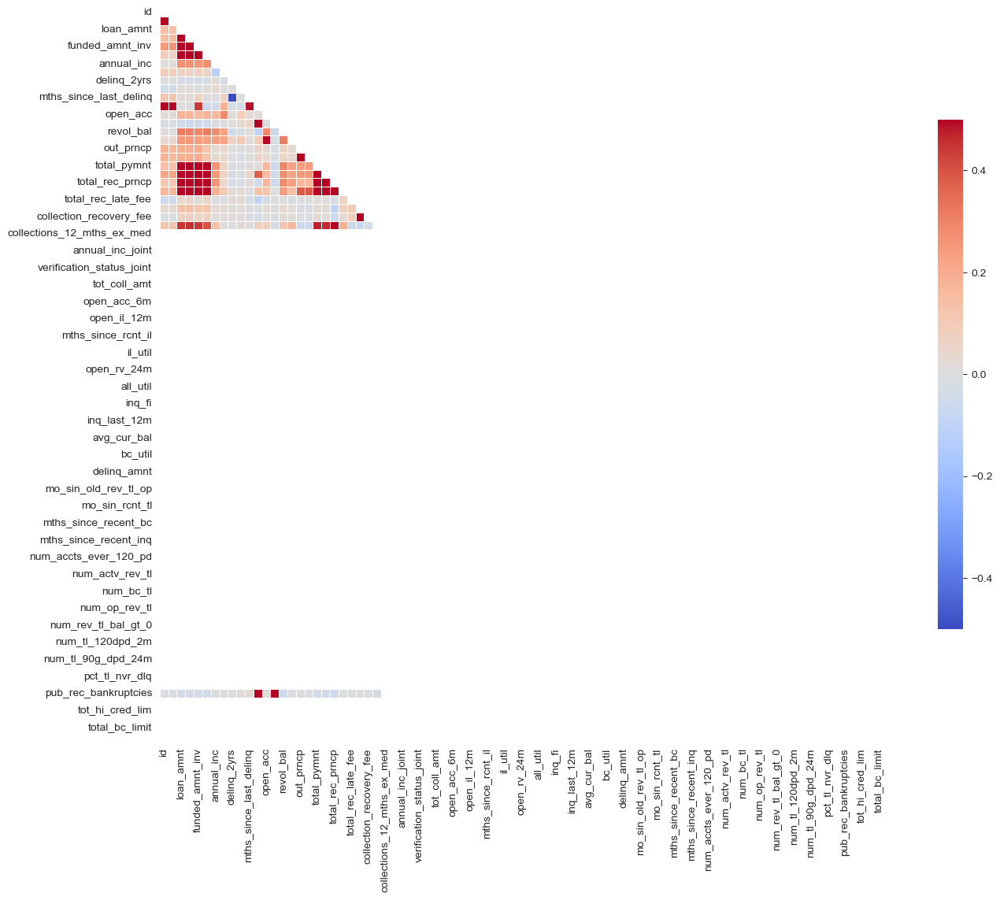

In [60]:
relation_heatmap(data, 'Lona')

In [61]:
correlation.sort_values(by='value',ascending=False)

,columns,index,value
1376,out_prncp,out_prncp_inv,0.999827
1461,out_prncp_inv,out_prncp,0.999827
0,id,member_id,0.993650
85,member_id,id,0.993650
172,loan_amnt,funded_amnt,0.981578
257,funded_amnt,loan_amnt,0.981578
1549,total_pymnt,total_rec_prncp,0.971472
1718,total_rec_prncp,total_pymnt,0.971472
1548,total_pymnt,total_pymnt_inv,0.970815
1633,total_pymnt_inv,total_pymnt,0.970815


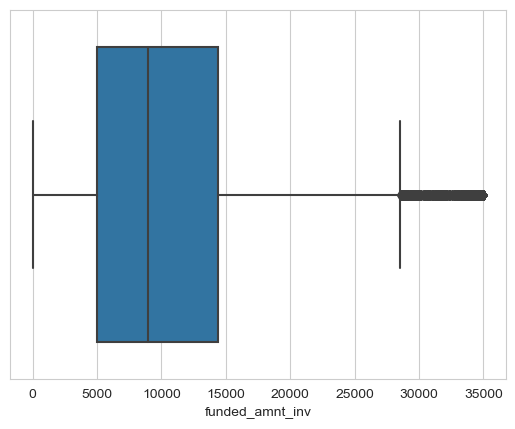

funded_amnt_inv


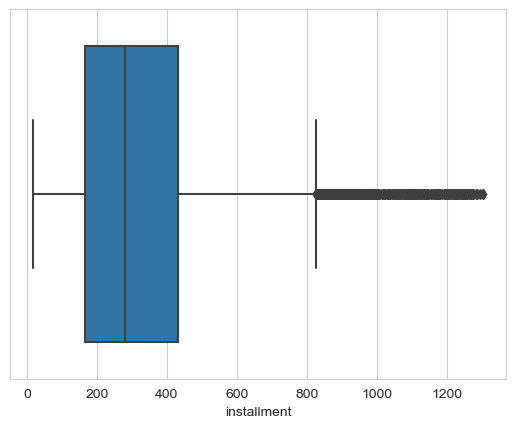

installment


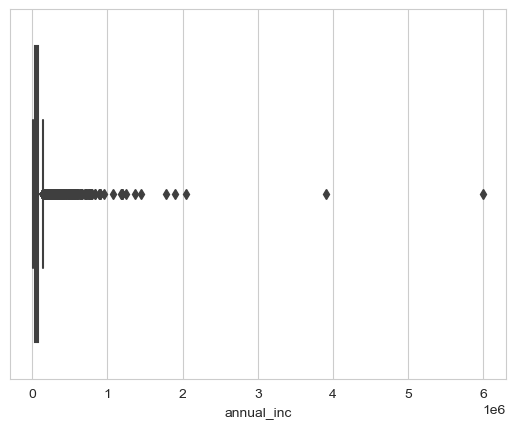

annual_inc


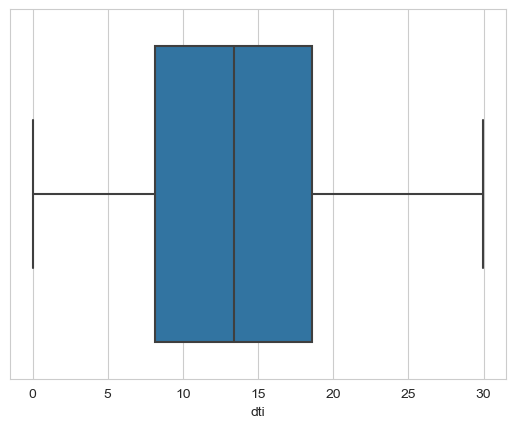

dti


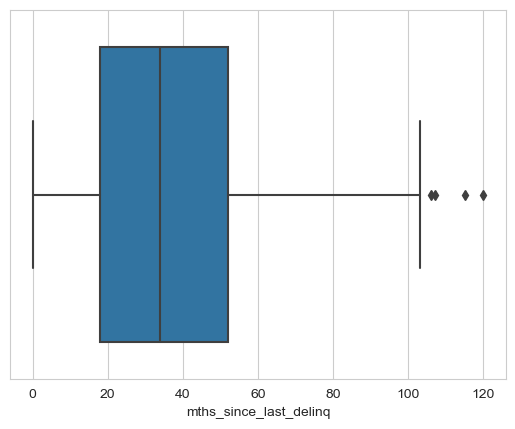

mths_since_last_delinq


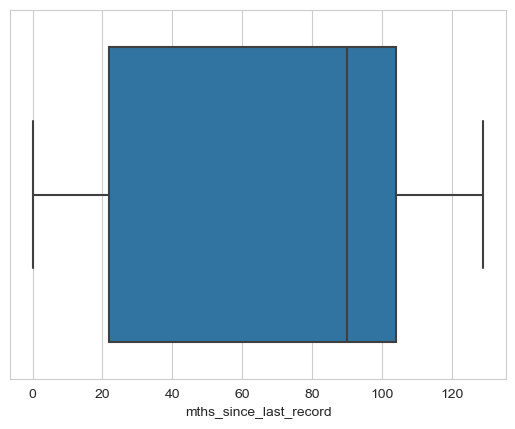

mths_since_last_record


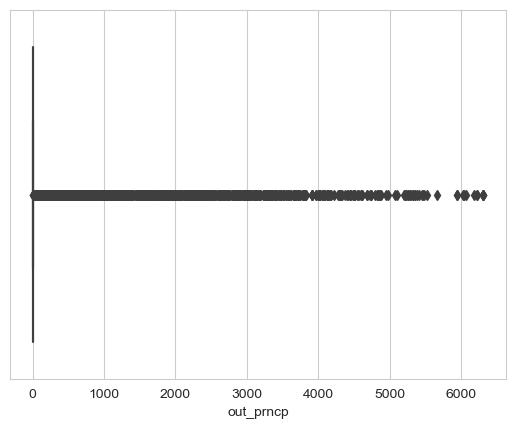

out_prncp


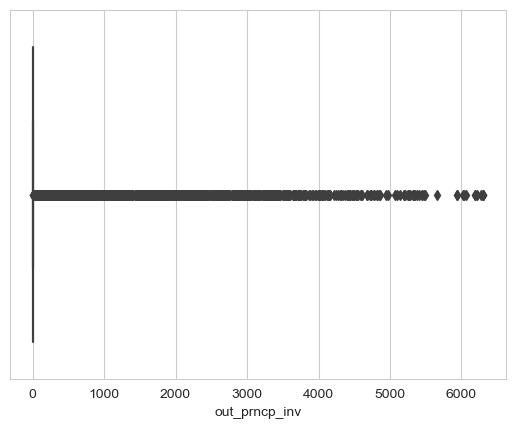

out_prncp_inv


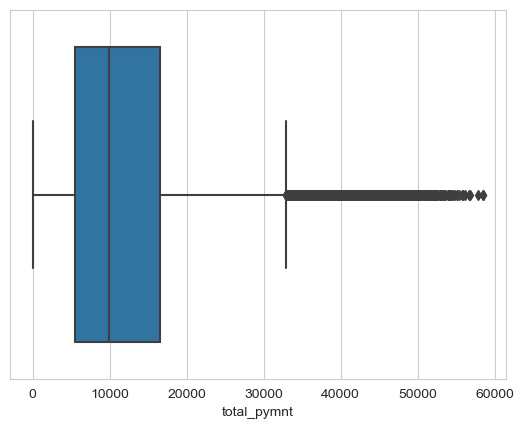

total_pymnt


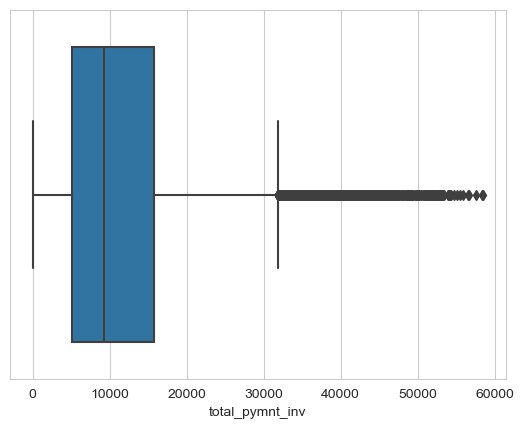

total_pymnt_inv


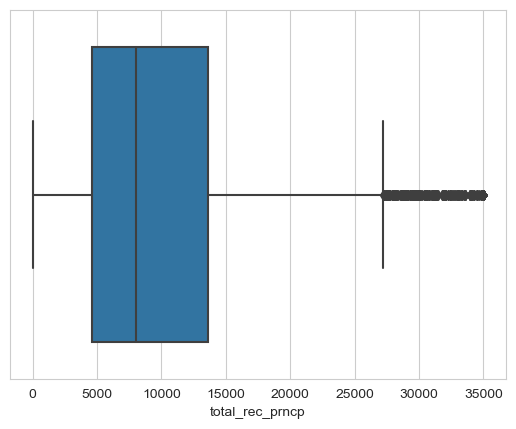

total_rec_prncp


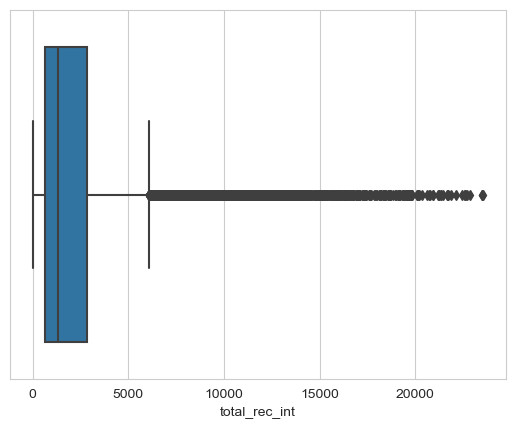

total_rec_int


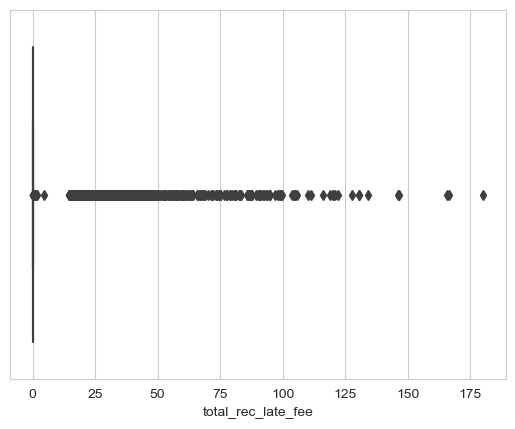

total_rec_late_fee


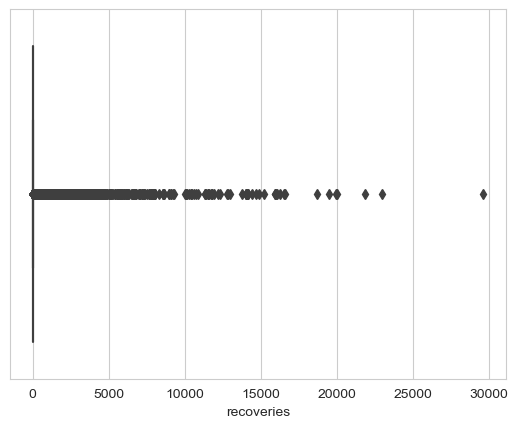

recoveries


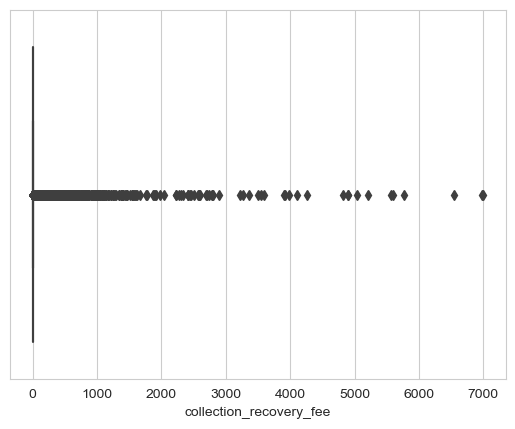

collection_recovery_fee


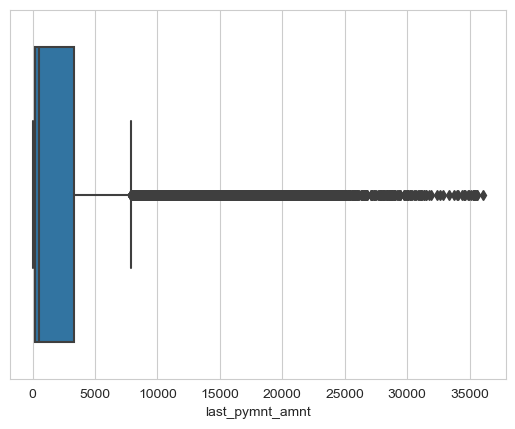

last_pymnt_amnt


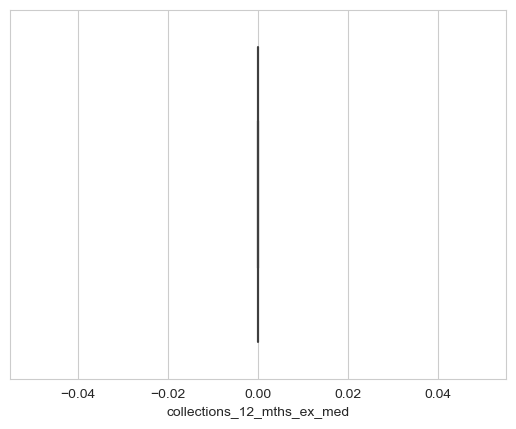

collections_12_mths_ex_med


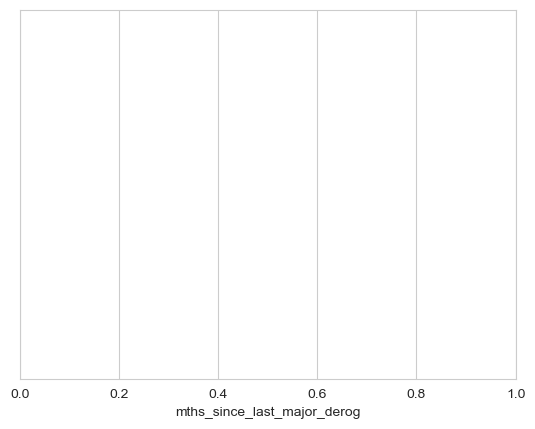

mths_since_last_major_derog


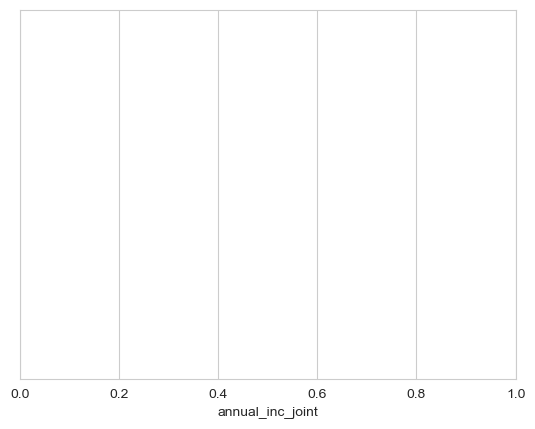

annual_inc_joint


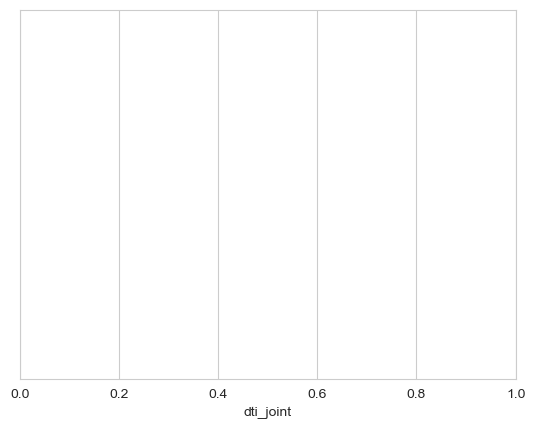

dti_joint


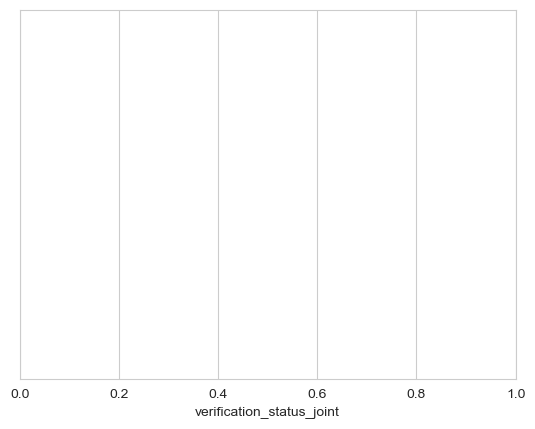

verification_status_joint


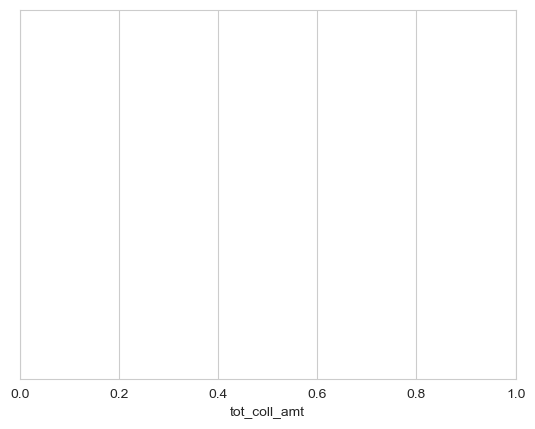

tot_coll_amt


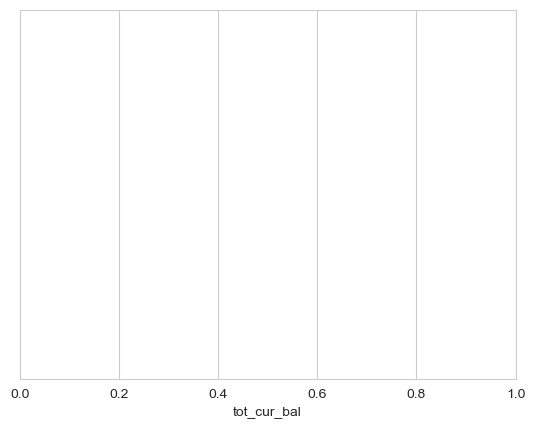

tot_cur_bal


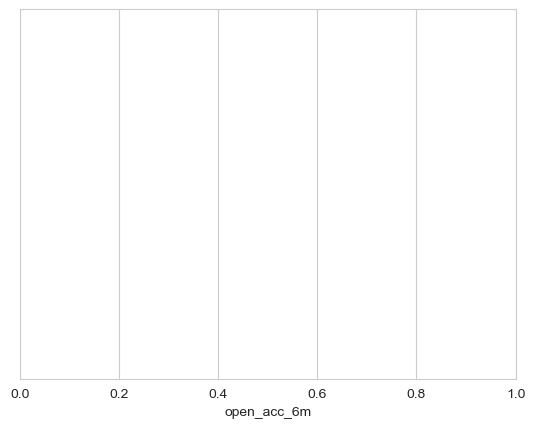

open_acc_6m


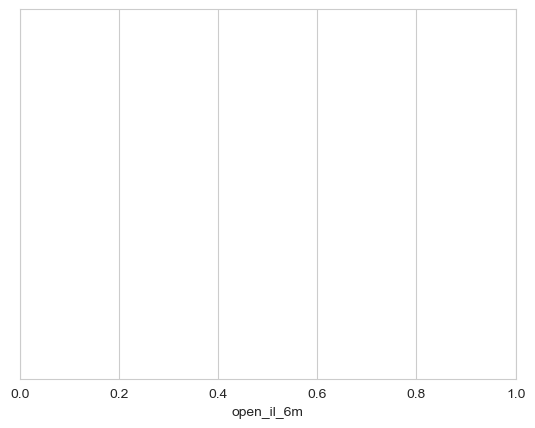

open_il_6m


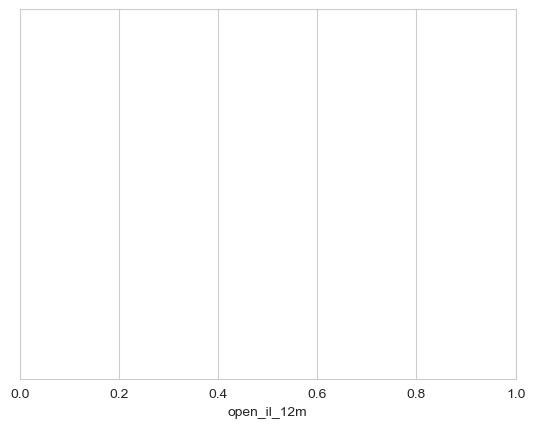

open_il_12m


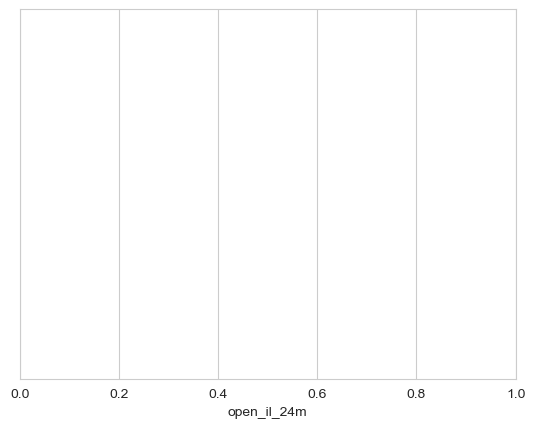

open_il_24m


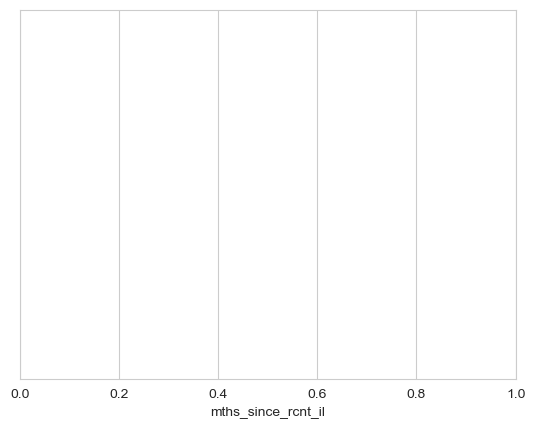

mths_since_rcnt_il


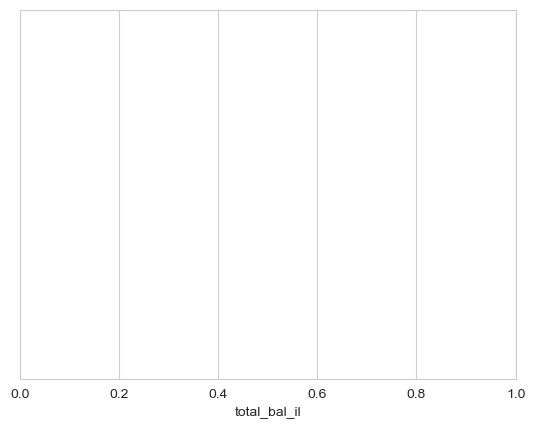

total_bal_il


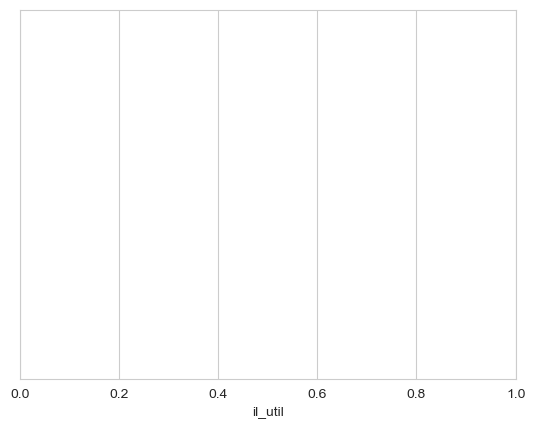

il_util


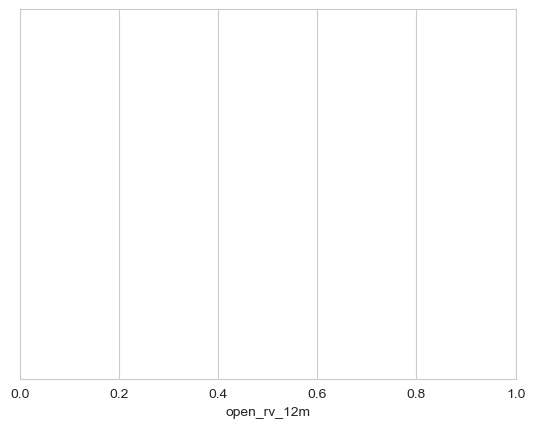

open_rv_12m


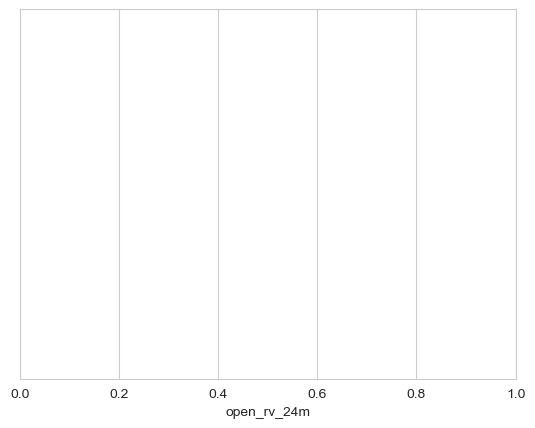

open_rv_24m


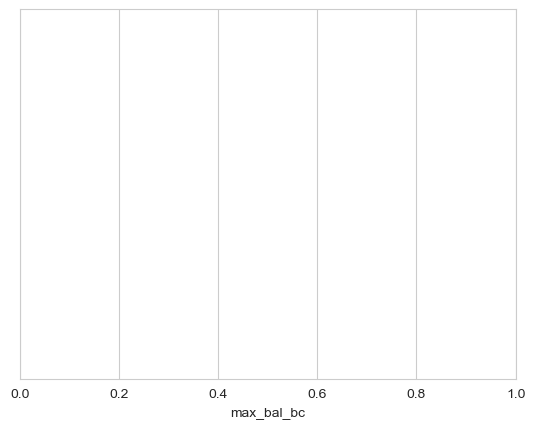

max_bal_bc


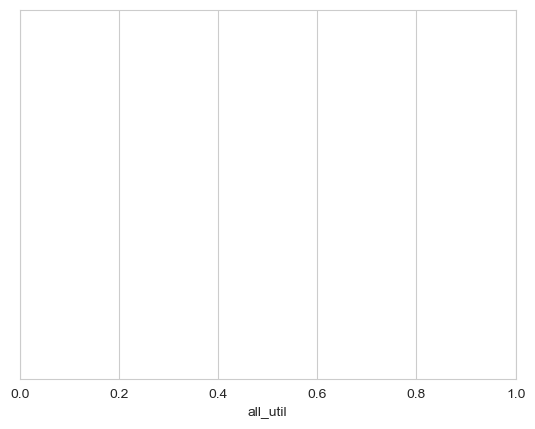

all_util


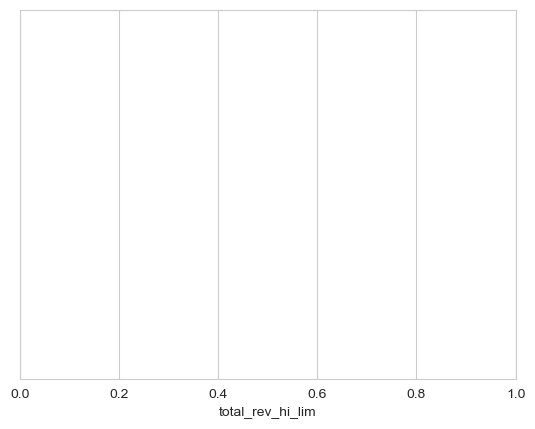

total_rev_hi_lim


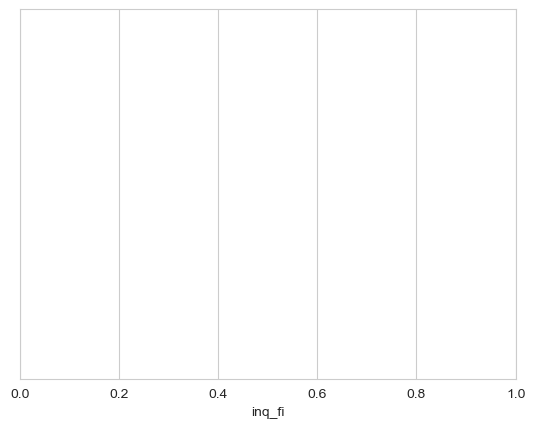

inq_fi


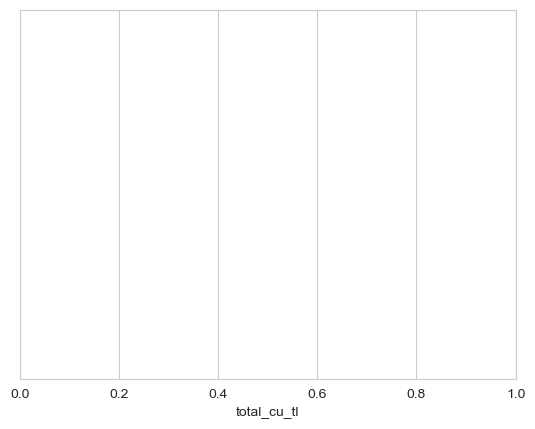

total_cu_tl


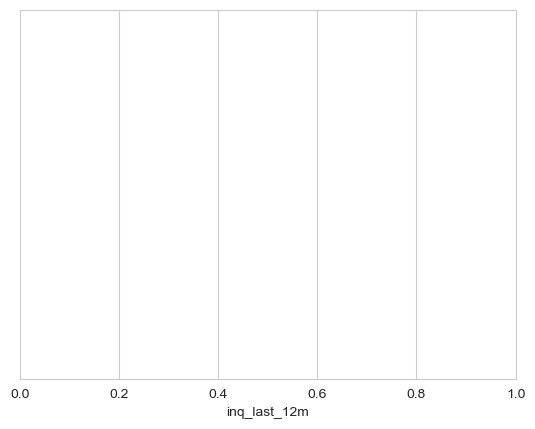

inq_last_12m


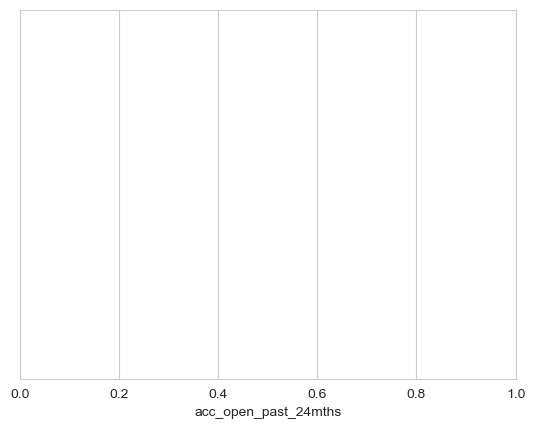

acc_open_past_24mths


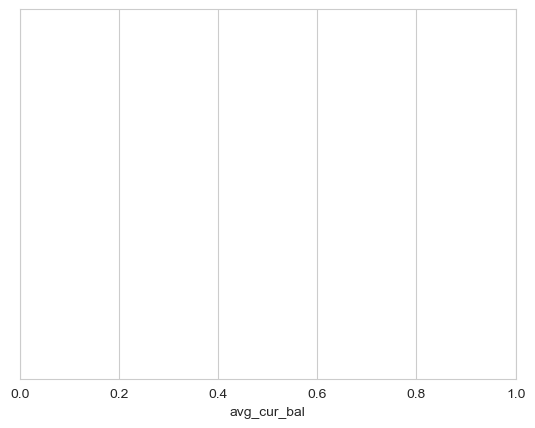

avg_cur_bal


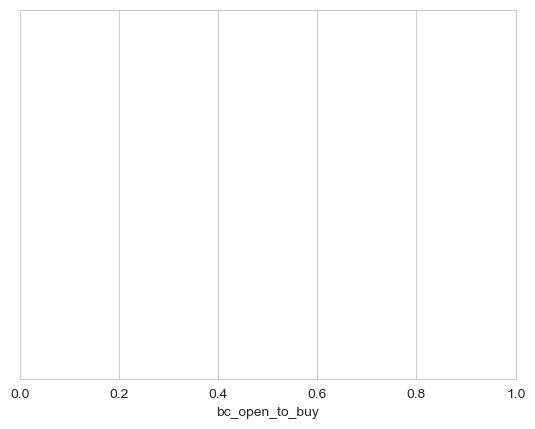

bc_open_to_buy


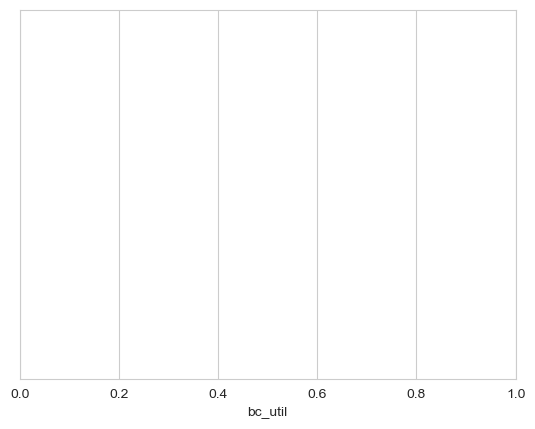

bc_util


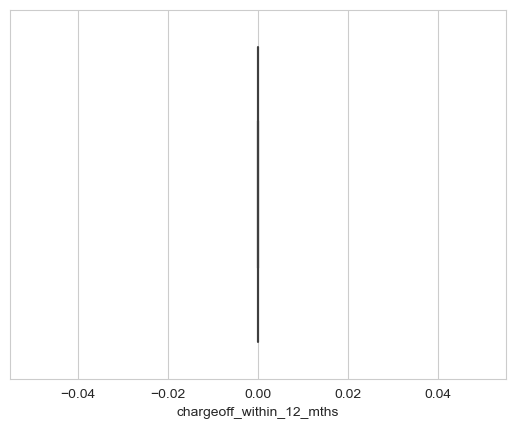

chargeoff_within_12_mths


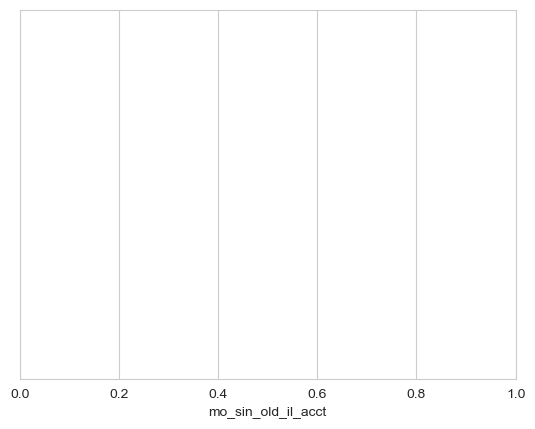

mo_sin_old_il_acct


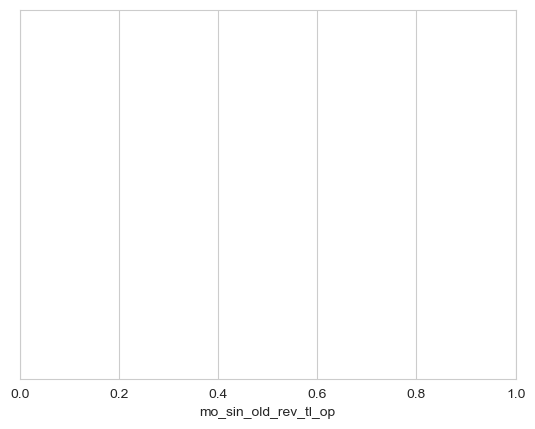

mo_sin_old_rev_tl_op


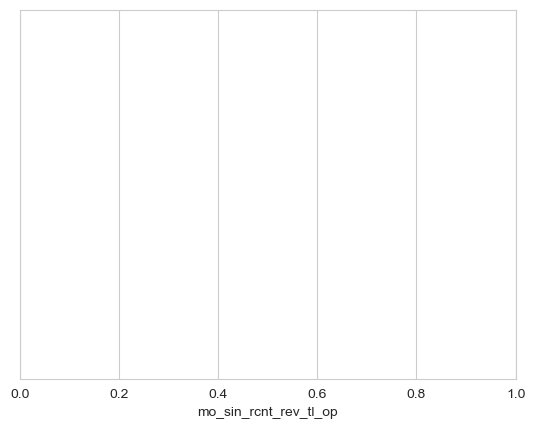

mo_sin_rcnt_rev_tl_op


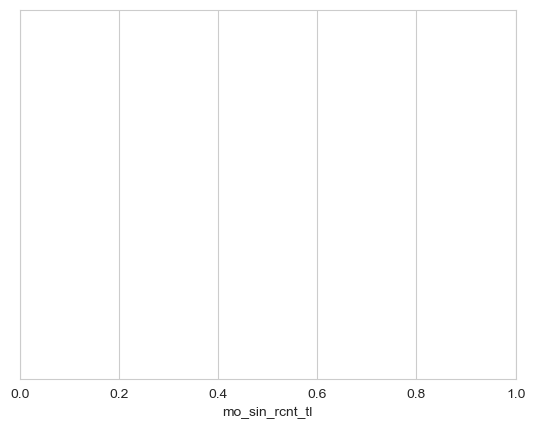

mo_sin_rcnt_tl


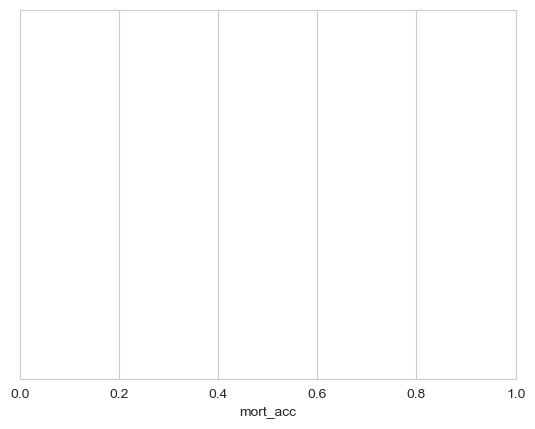

mort_acc


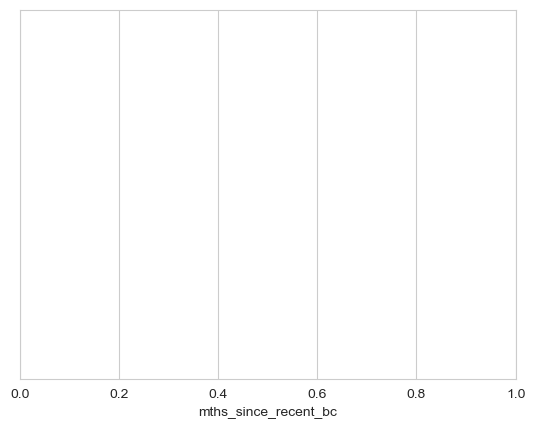

mths_since_recent_bc


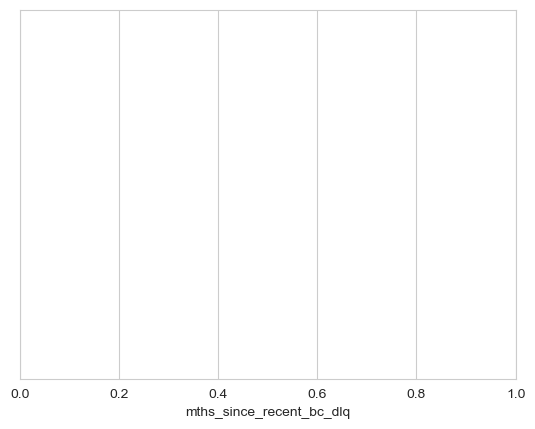

mths_since_recent_bc_dlq


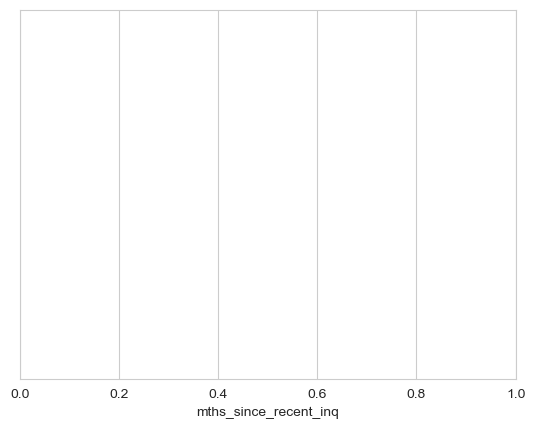

mths_since_recent_inq


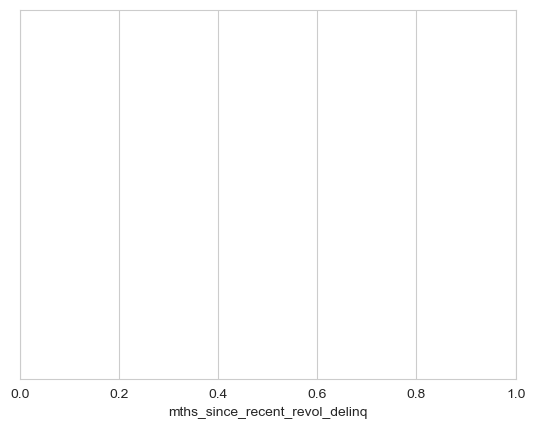

mths_since_recent_revol_delinq


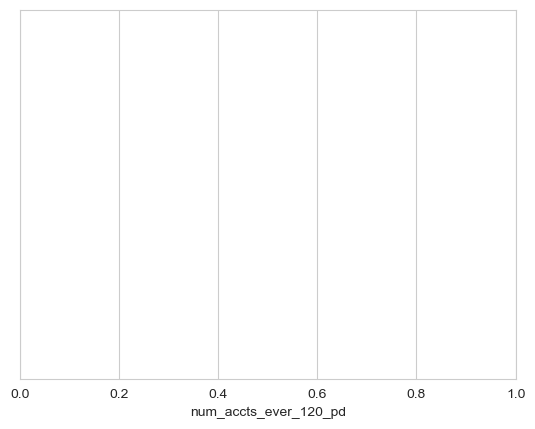

num_accts_ever_120_pd


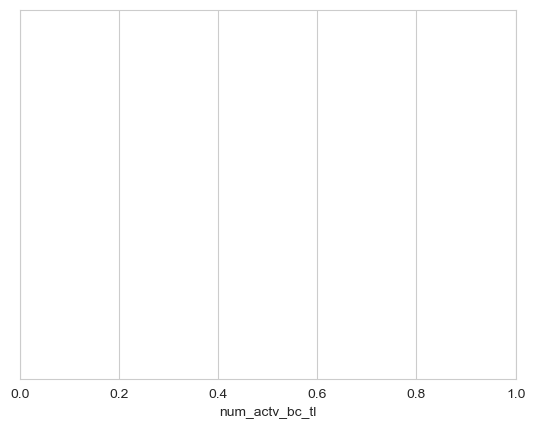

num_actv_bc_tl


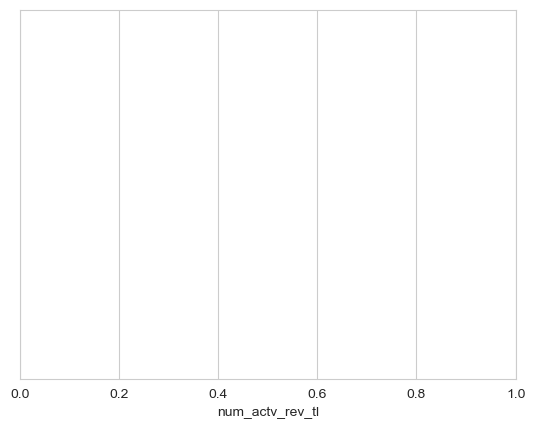

num_actv_rev_tl


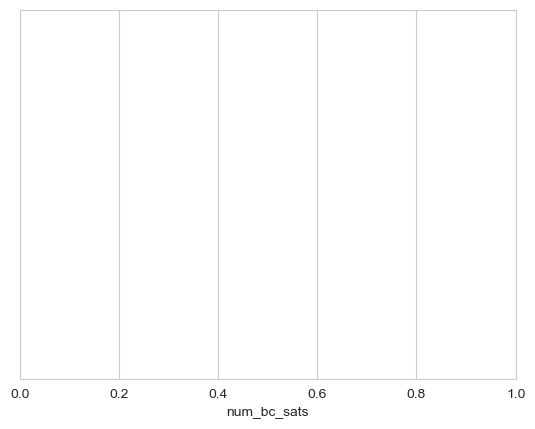

num_bc_sats


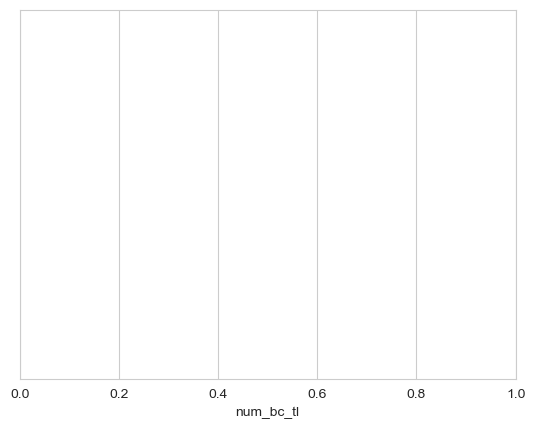

num_bc_tl


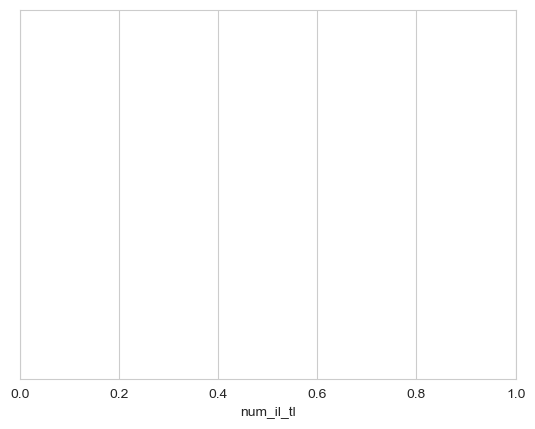

num_il_tl


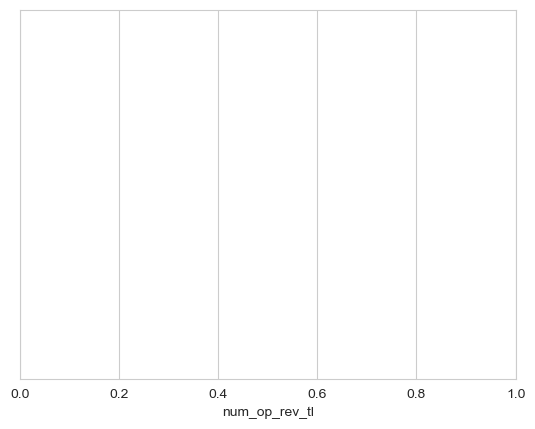

num_op_rev_tl


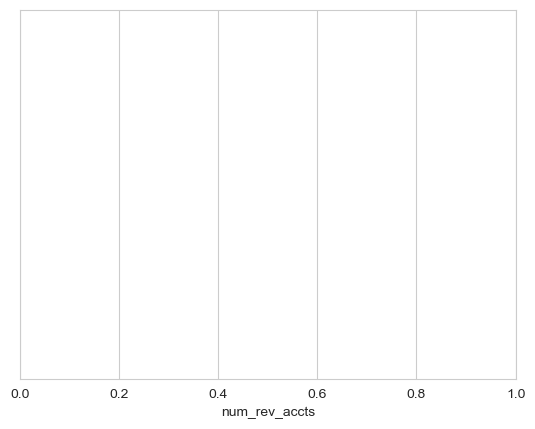

num_rev_accts


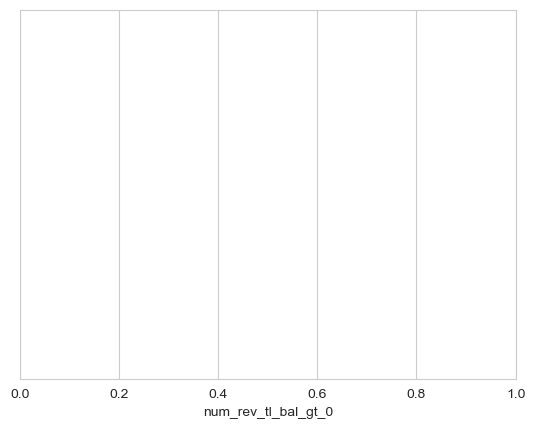

num_rev_tl_bal_gt_0


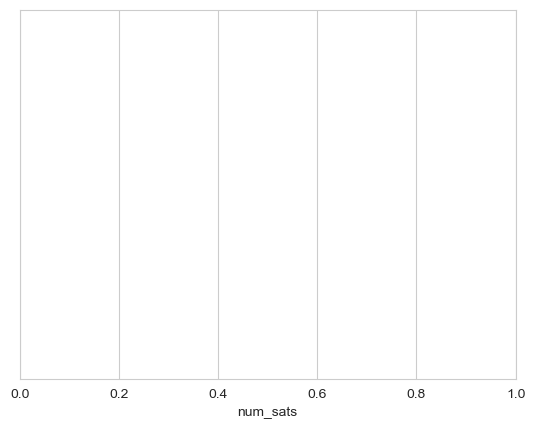

num_sats


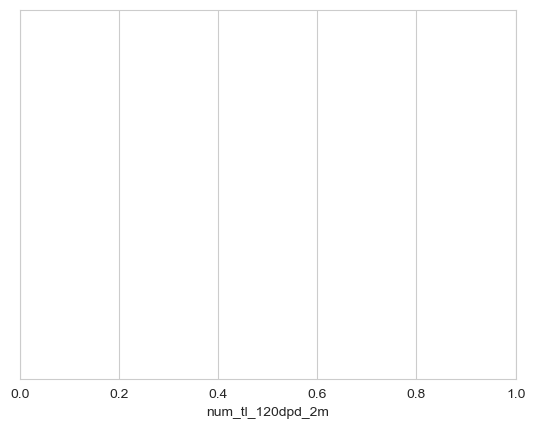

num_tl_120dpd_2m


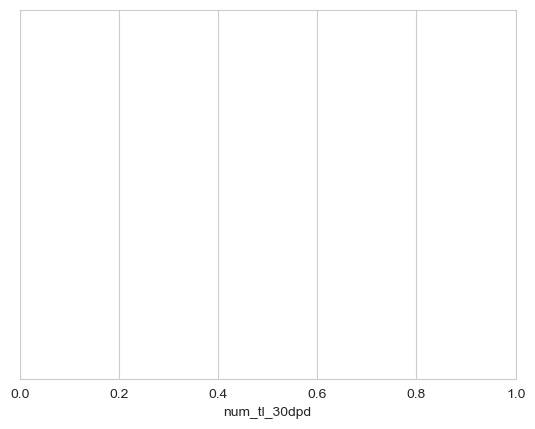

num_tl_30dpd


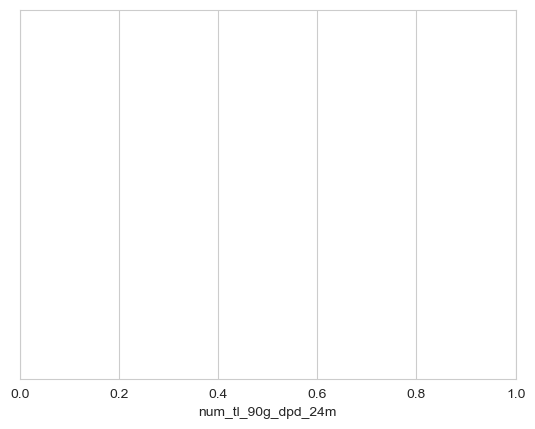

num_tl_90g_dpd_24m


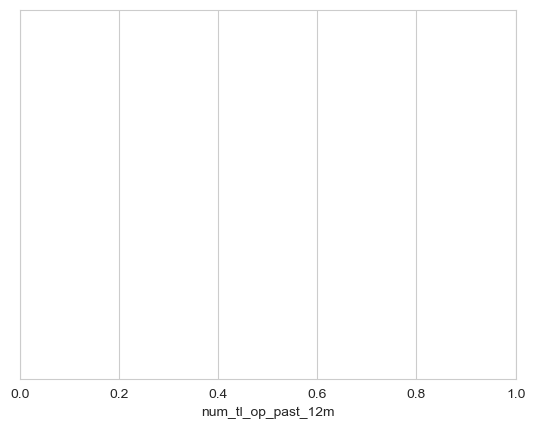

num_tl_op_past_12m


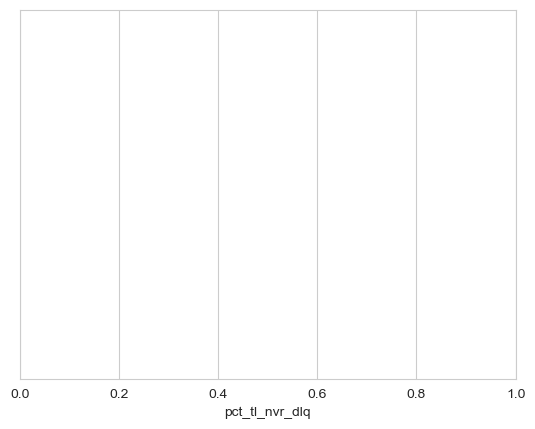

pct_tl_nvr_dlq


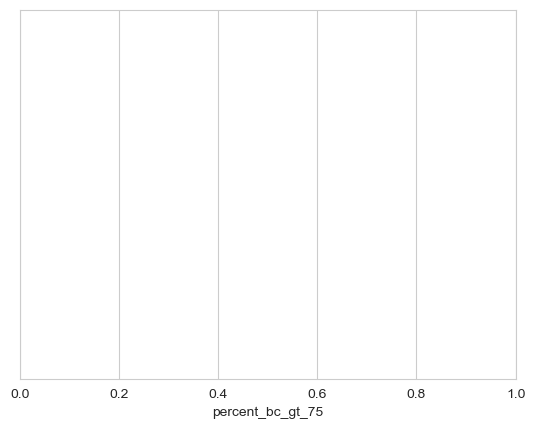

percent_bc_gt_75


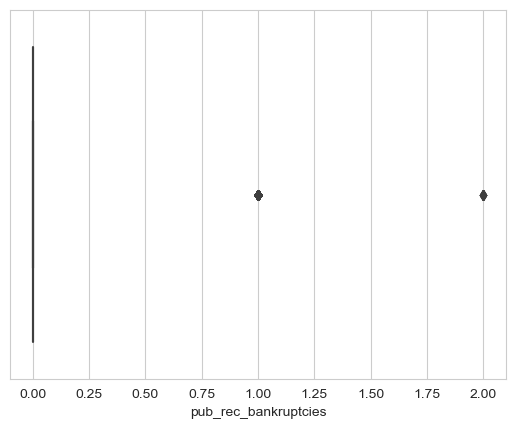

pub_rec_bankruptcies


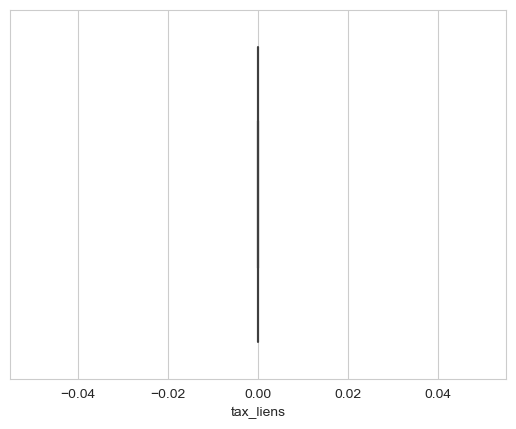

tax_liens


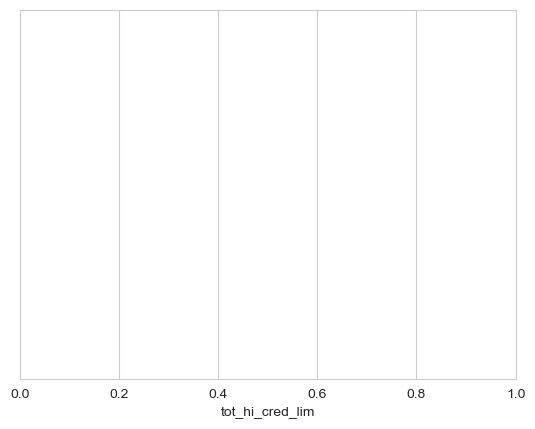

tot_hi_cred_lim


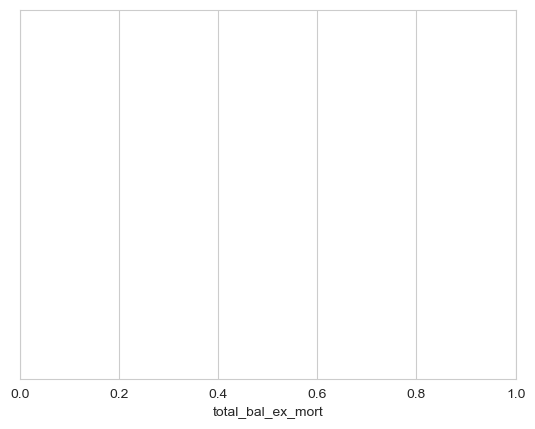

total_bal_ex_mort


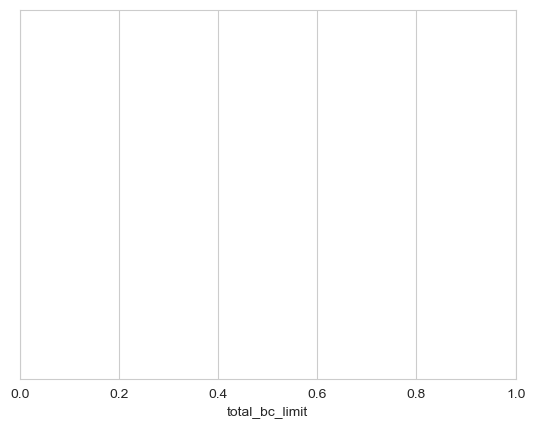

total_bc_limit


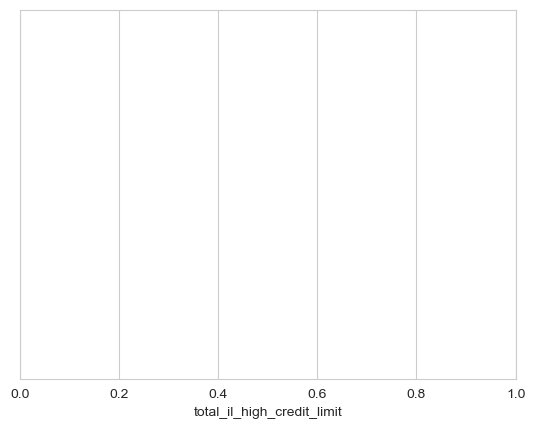

total_il_high_credit_limit


In [62]:
#Data distribution check
float=[]
for i in data.columns:
    if data[i].dtype=='float64':
        sns.boxplot(data[pd.notna(data[i])][i])
        plt.show()
        print(i)                                   #checking the distribution of the numeric columns
                                            # It is observed that the datapoints in max. columns consist multivariate outliers
                                            #Data in max. columns are skewed towards right

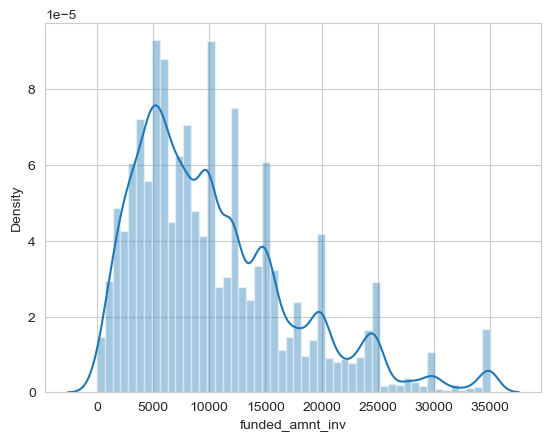

funded_amnt_inv


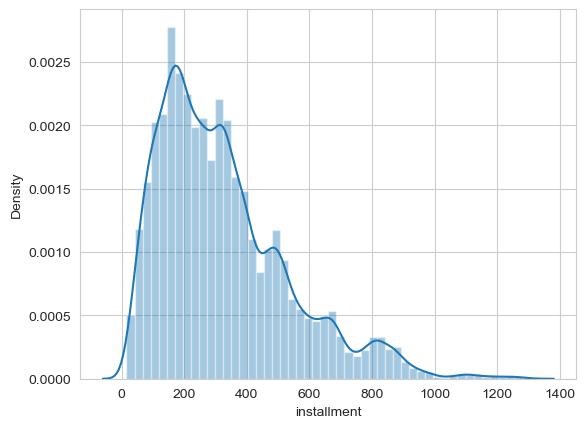

installment


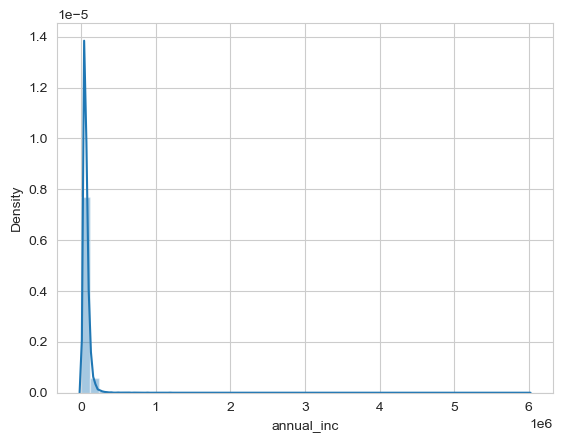

annual_inc


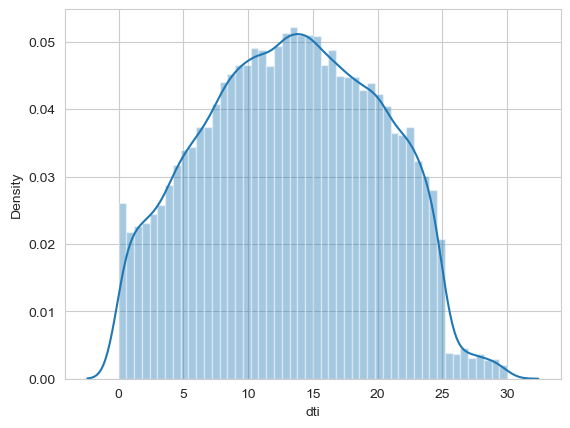

dti


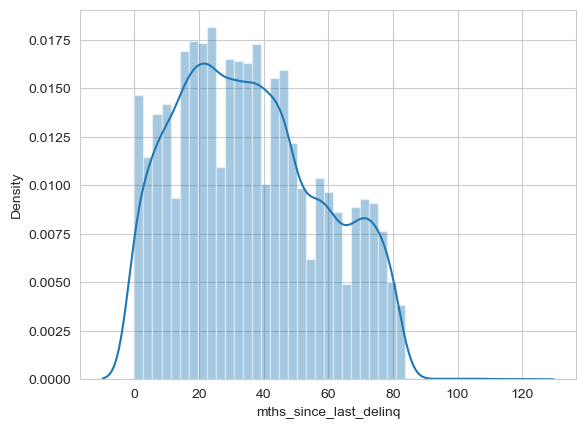

mths_since_last_delinq


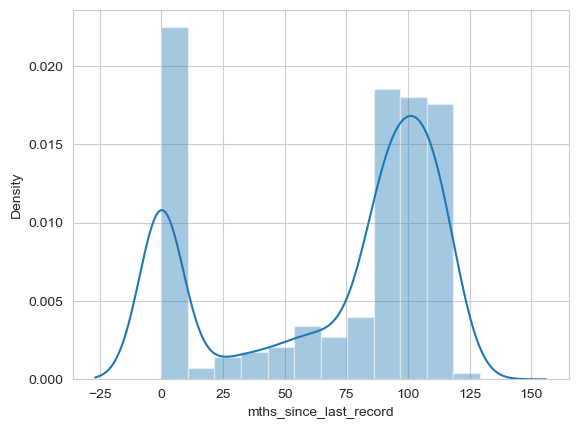

mths_since_last_record


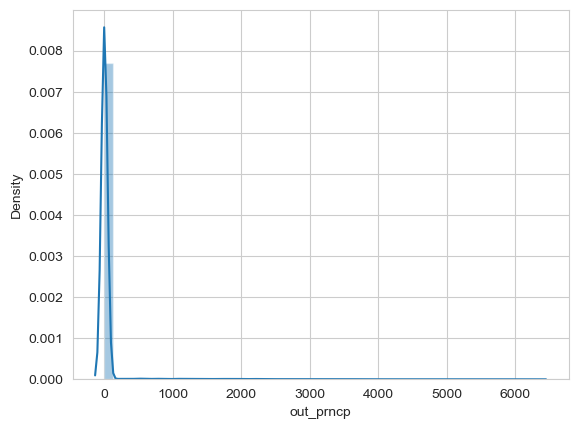

out_prncp


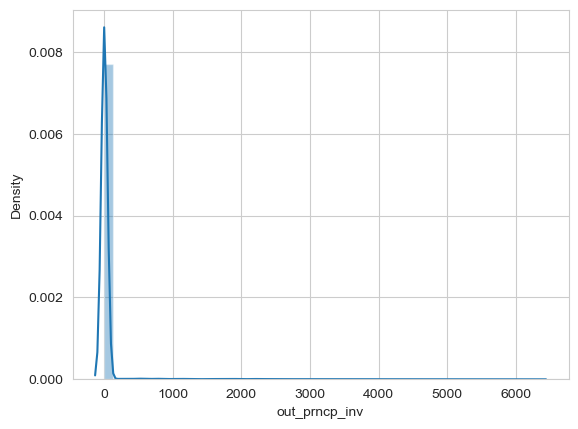

out_prncp_inv


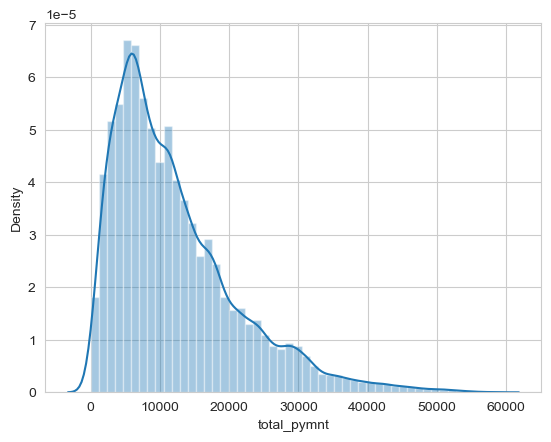

total_pymnt


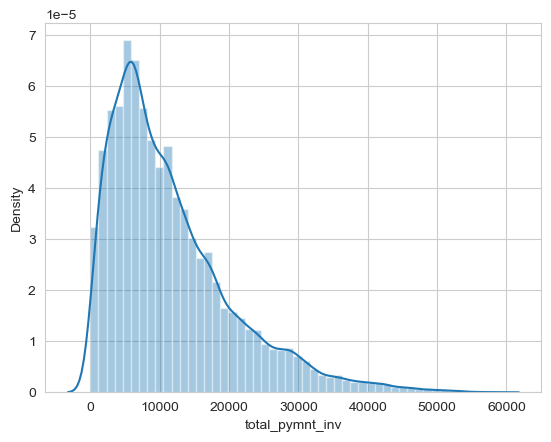

total_pymnt_inv


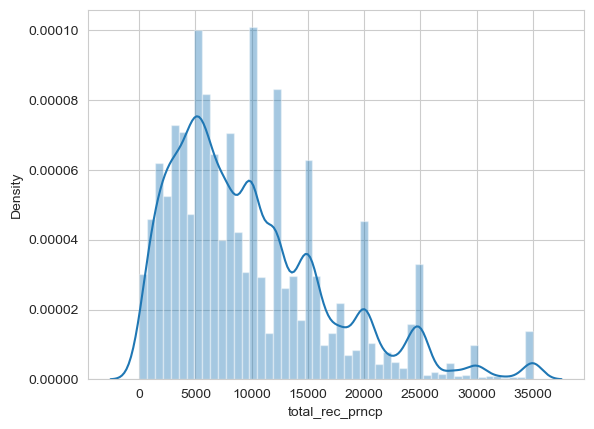

total_rec_prncp


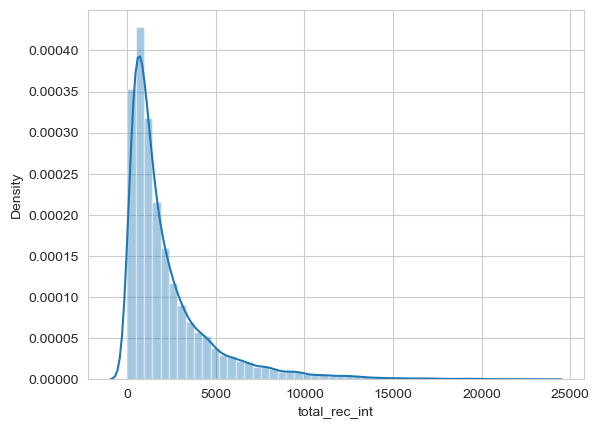

total_rec_int


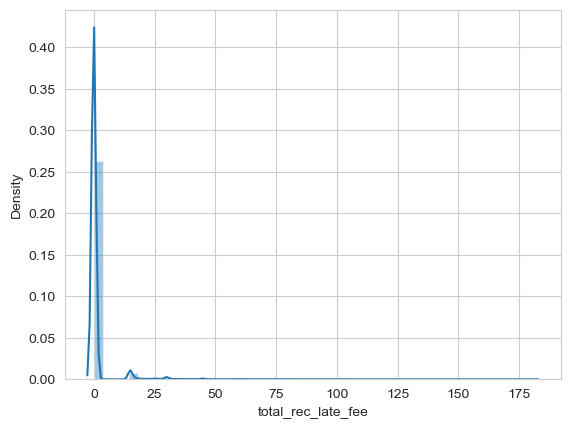

total_rec_late_fee


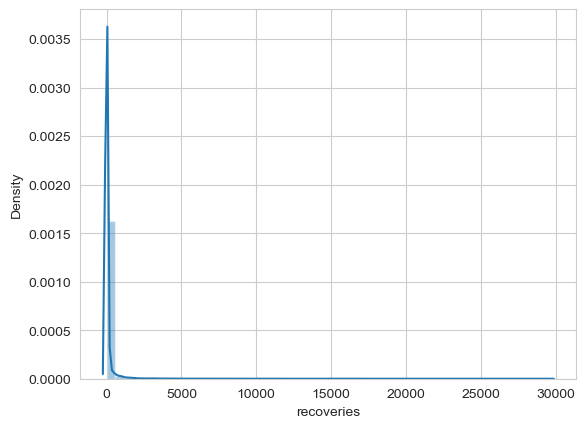

recoveries


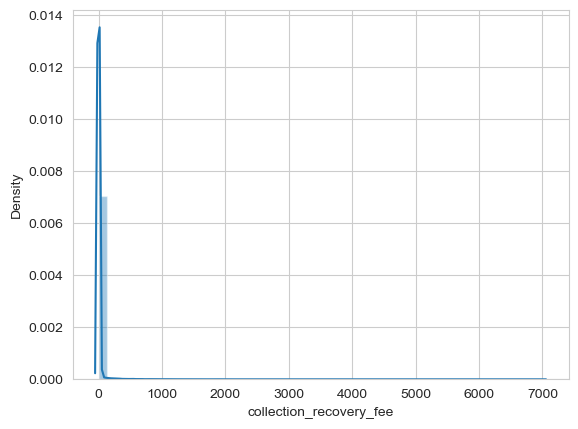

collection_recovery_fee


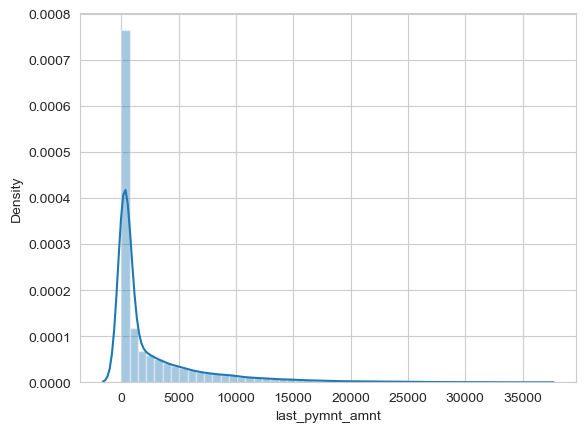

last_pymnt_amnt


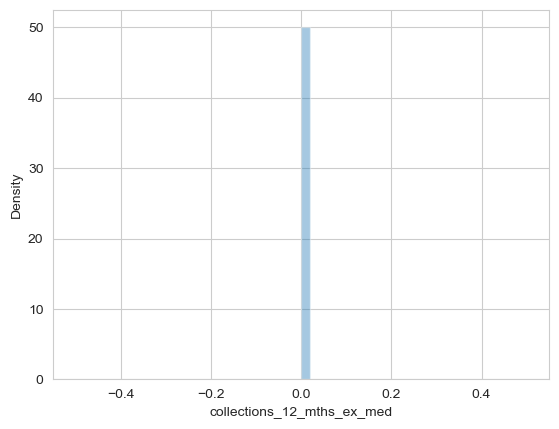

collections_12_mths_ex_med


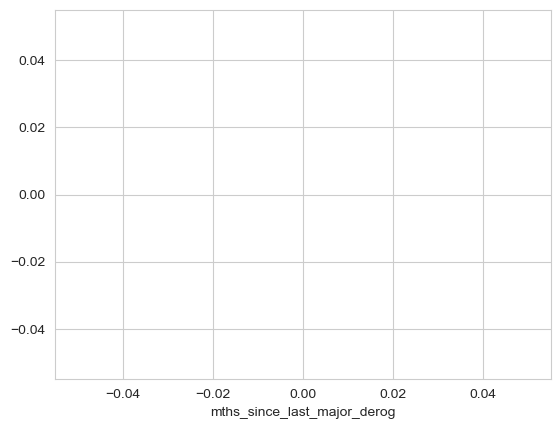

mths_since_last_major_derog


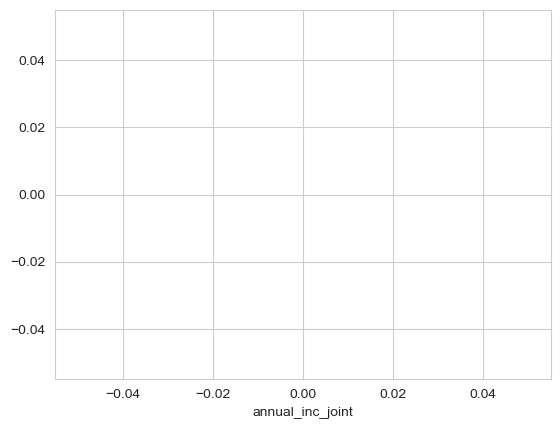

annual_inc_joint


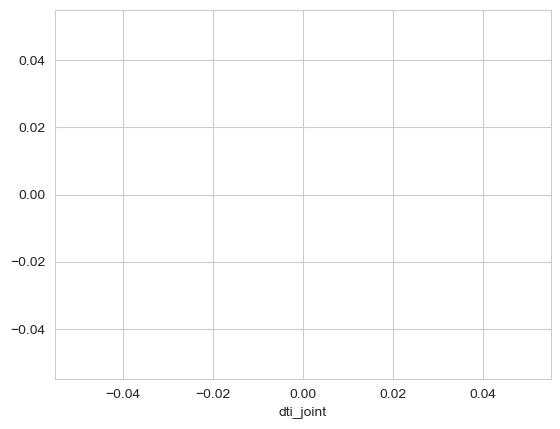

dti_joint


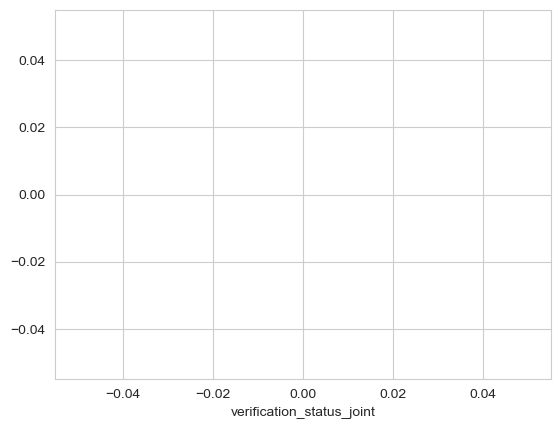

verification_status_joint


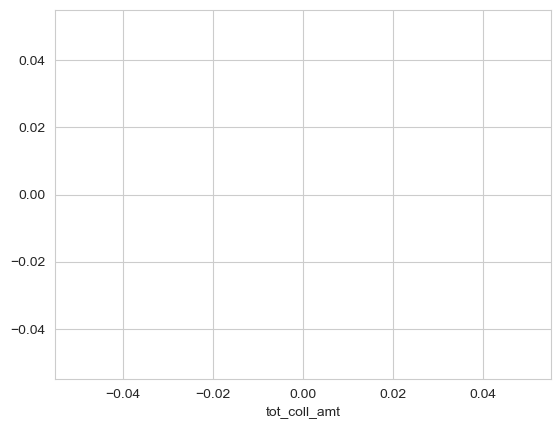

tot_coll_amt


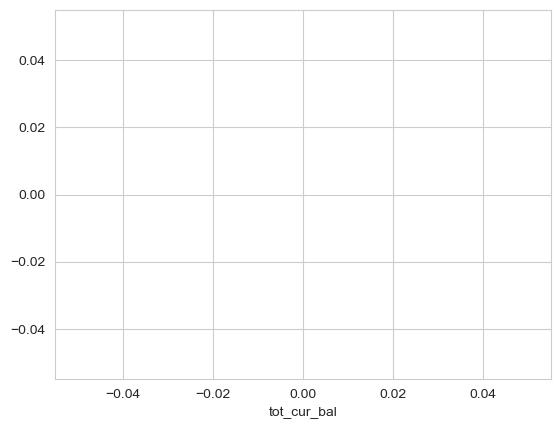

tot_cur_bal


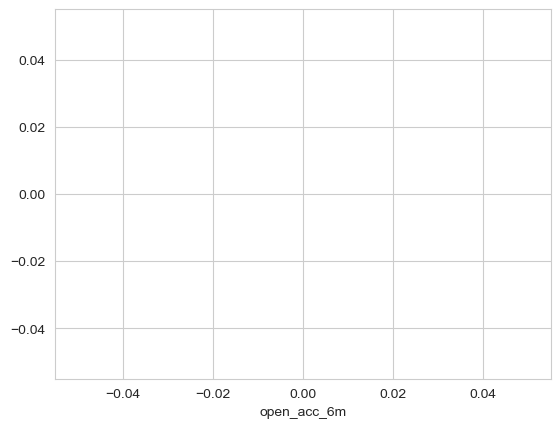

open_acc_6m


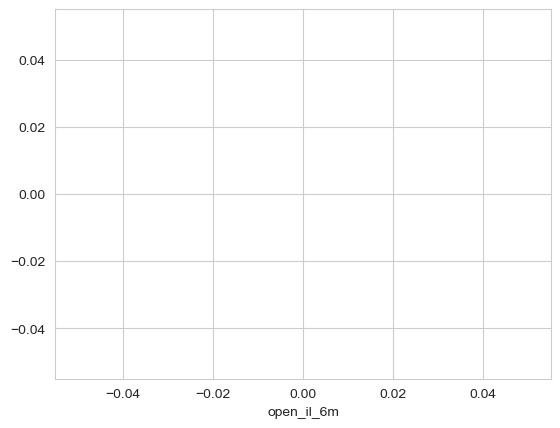

open_il_6m


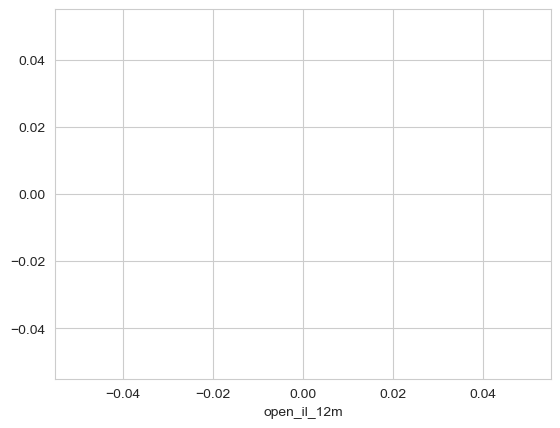

open_il_12m


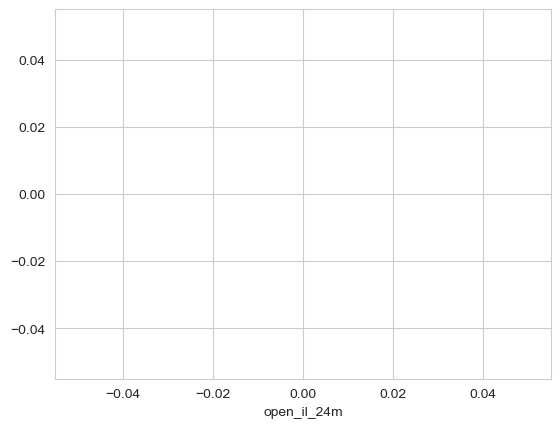

open_il_24m


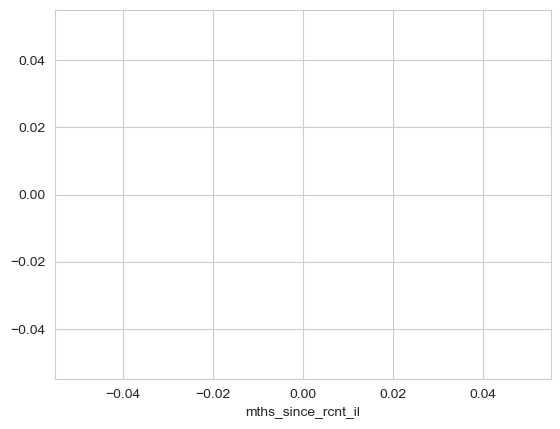

mths_since_rcnt_il


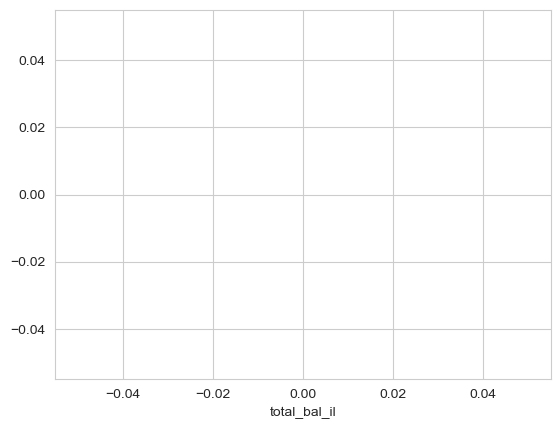

total_bal_il


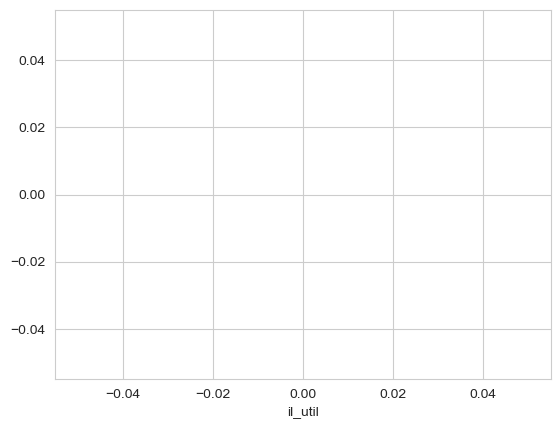

il_util


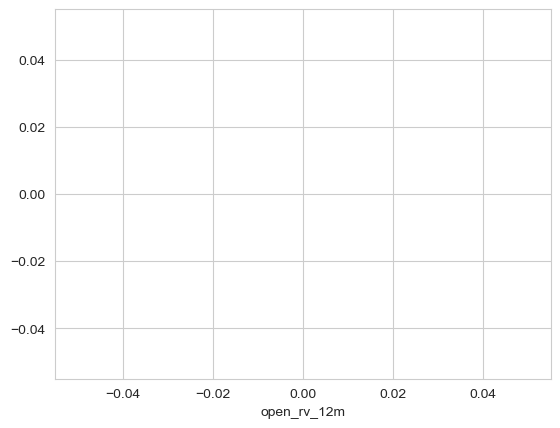

open_rv_12m


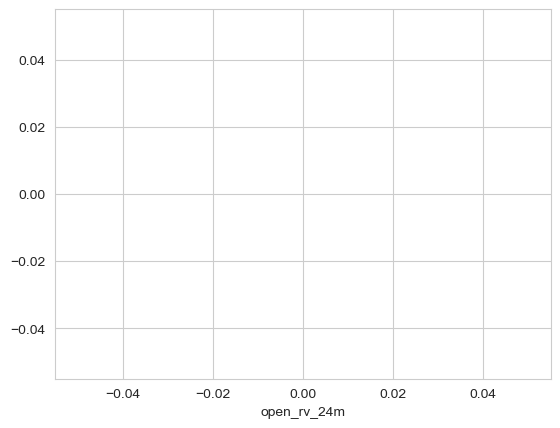

open_rv_24m


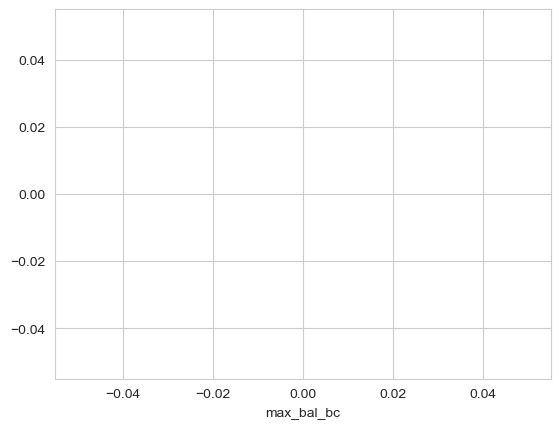

max_bal_bc


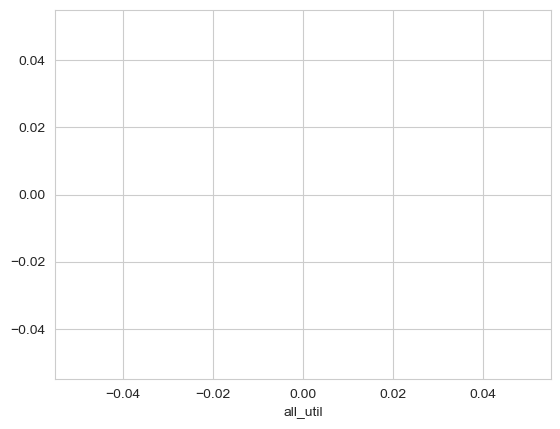

all_util


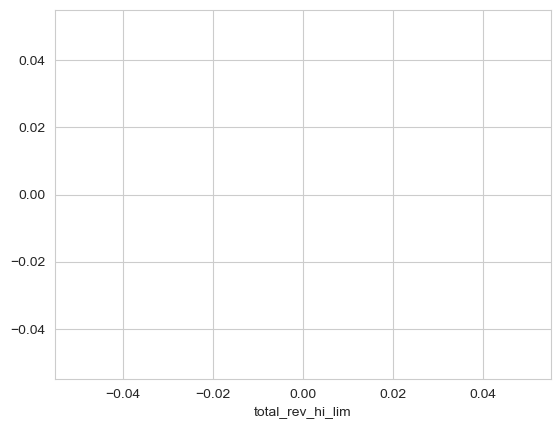

total_rev_hi_lim


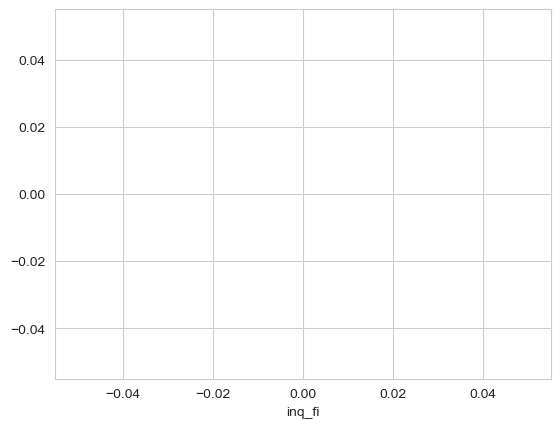

inq_fi


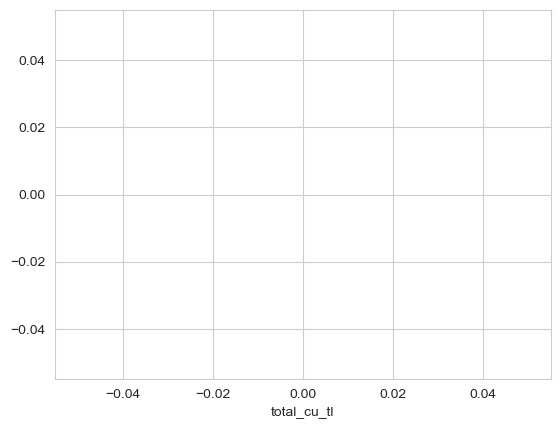

total_cu_tl


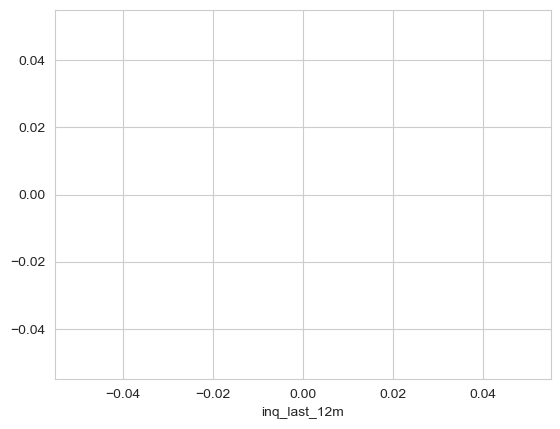

inq_last_12m


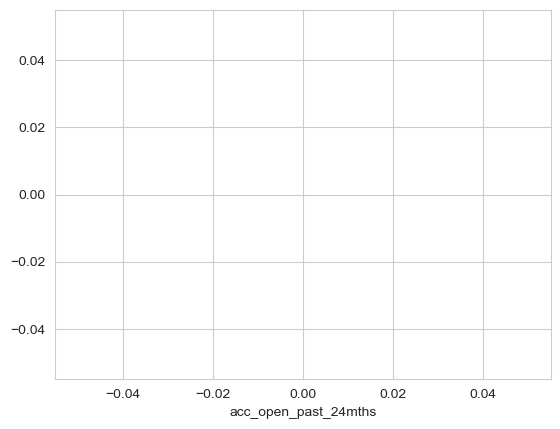

acc_open_past_24mths


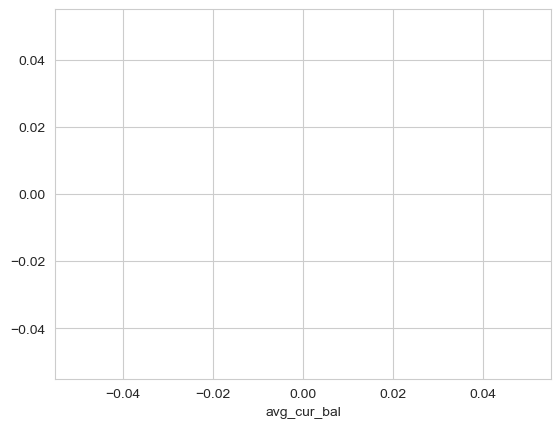

avg_cur_bal


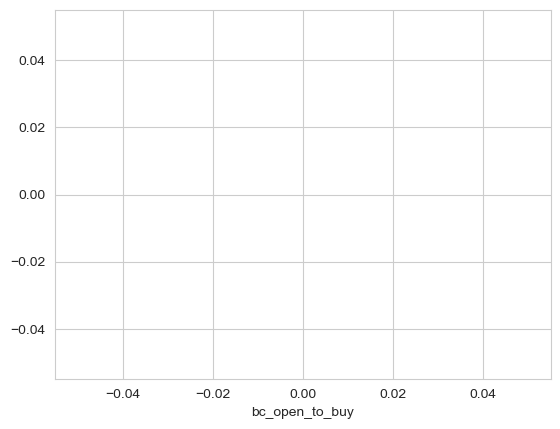

bc_open_to_buy


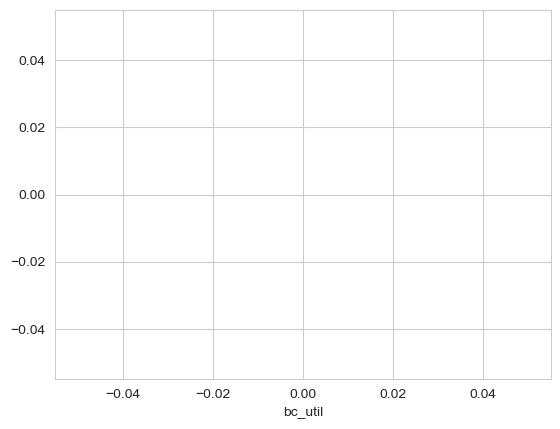

bc_util


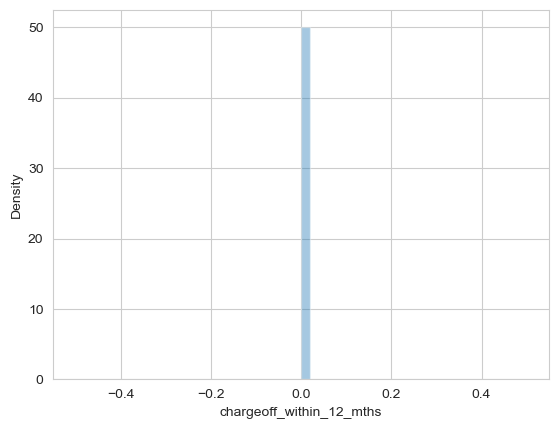

chargeoff_within_12_mths


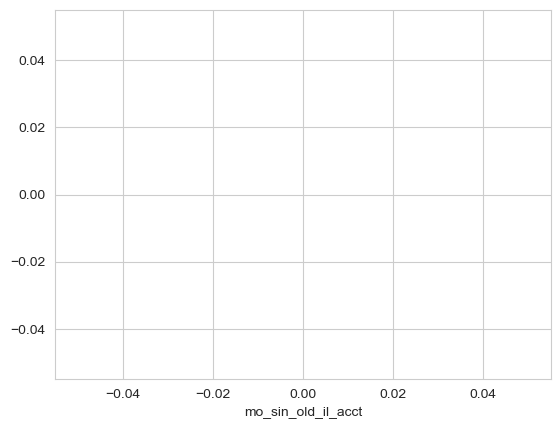

mo_sin_old_il_acct


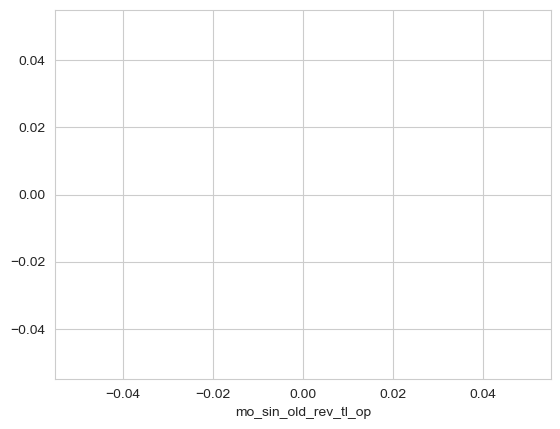

mo_sin_old_rev_tl_op


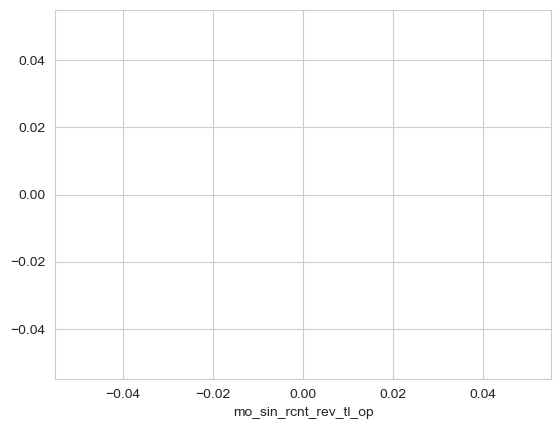

mo_sin_rcnt_rev_tl_op


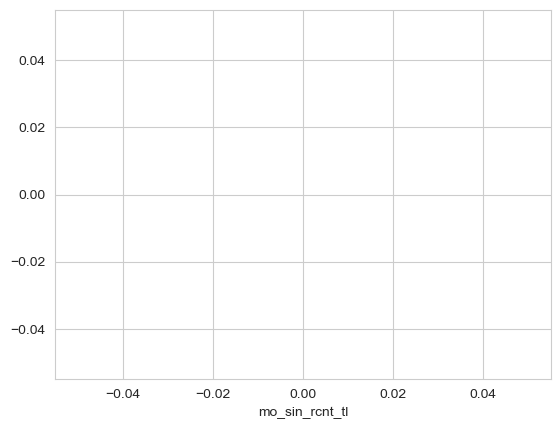

mo_sin_rcnt_tl


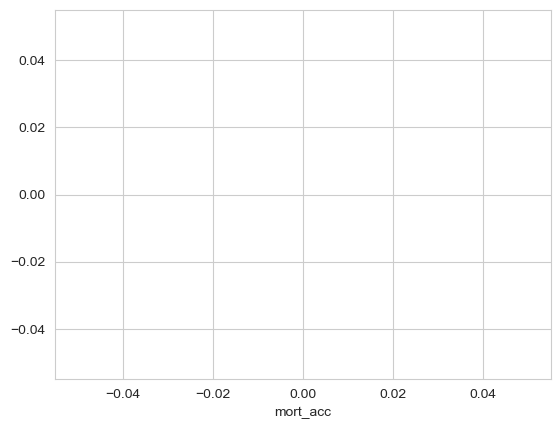

mort_acc


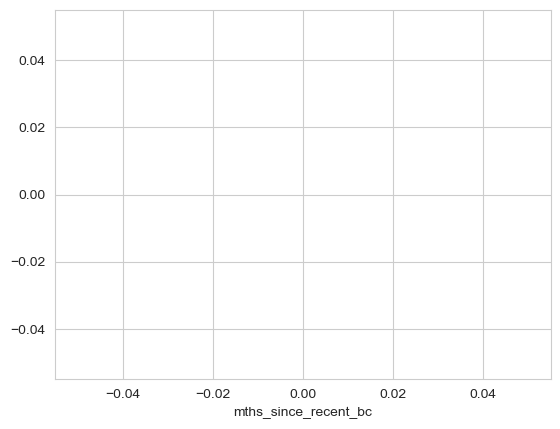

mths_since_recent_bc


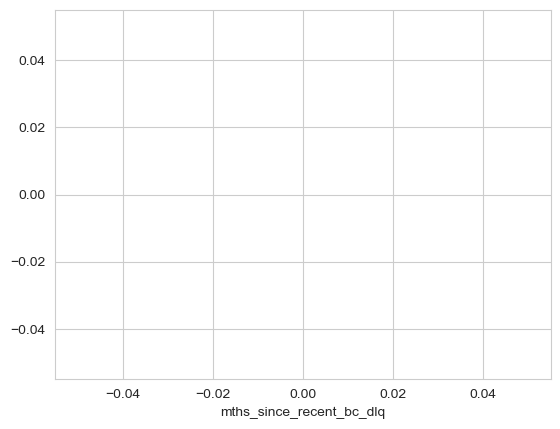

mths_since_recent_bc_dlq


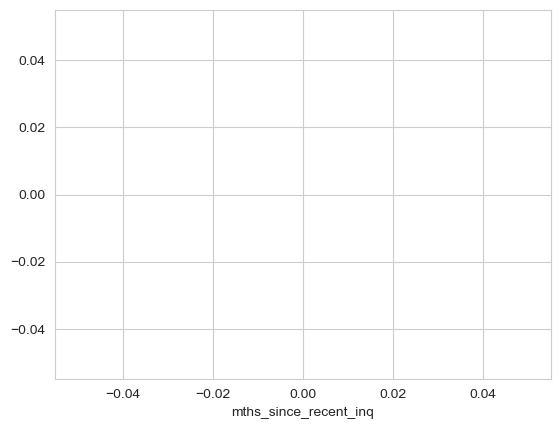

mths_since_recent_inq


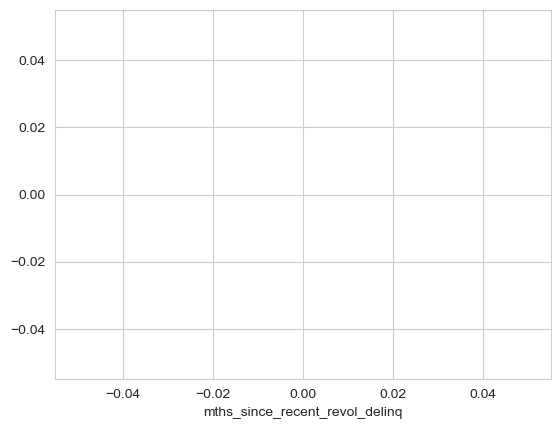

mths_since_recent_revol_delinq


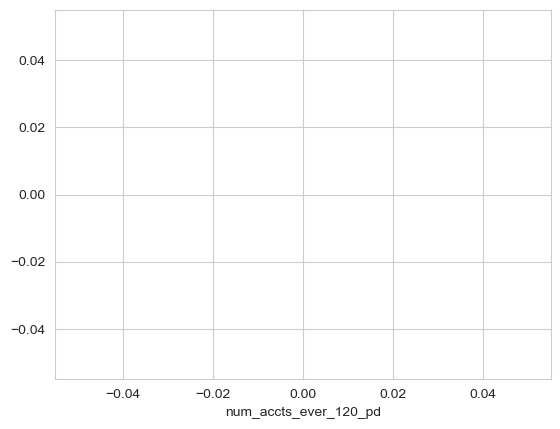

num_accts_ever_120_pd


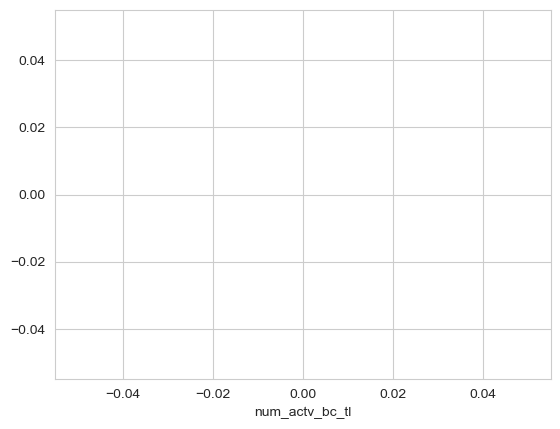

num_actv_bc_tl


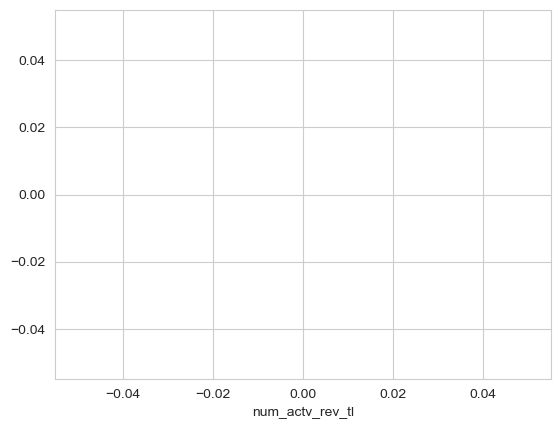

num_actv_rev_tl


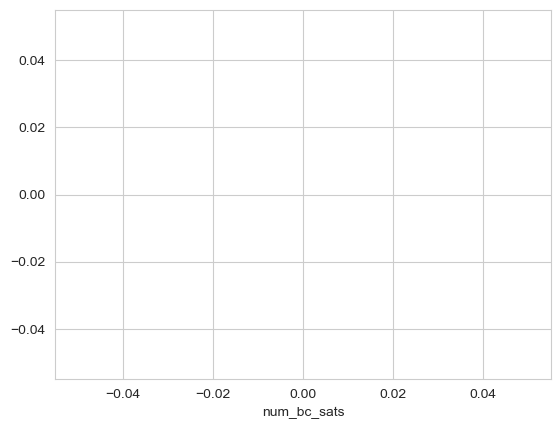

num_bc_sats


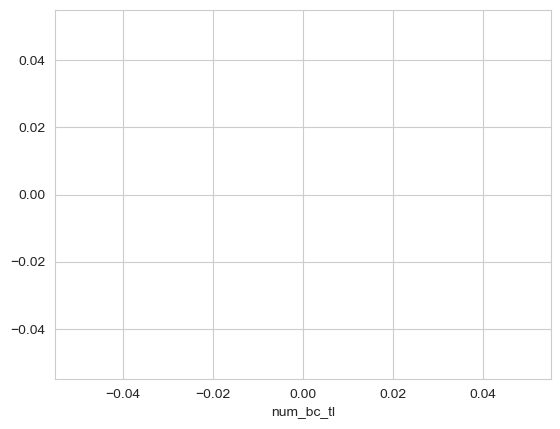

num_bc_tl


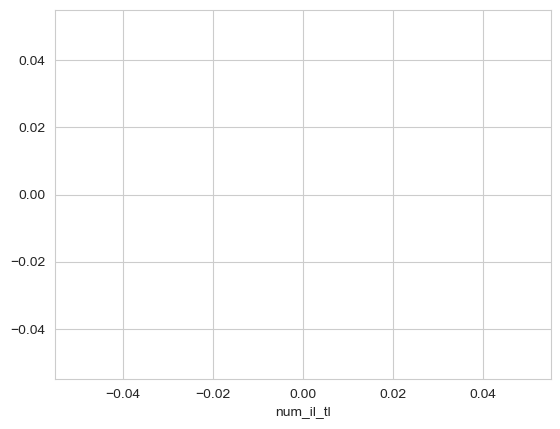

num_il_tl


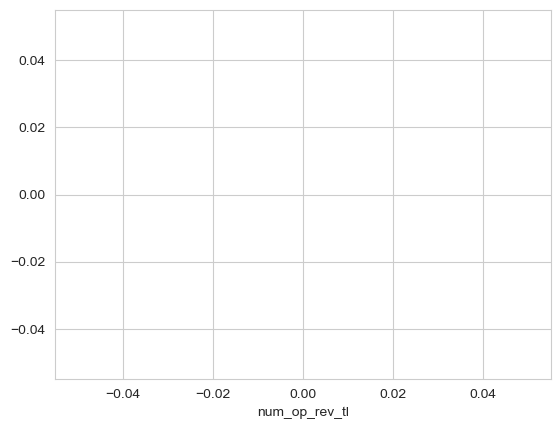

num_op_rev_tl


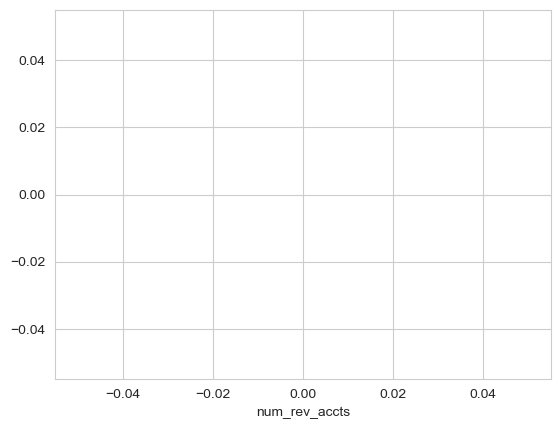

num_rev_accts


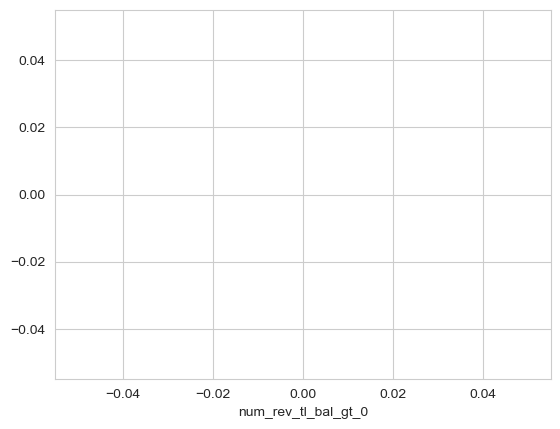

num_rev_tl_bal_gt_0


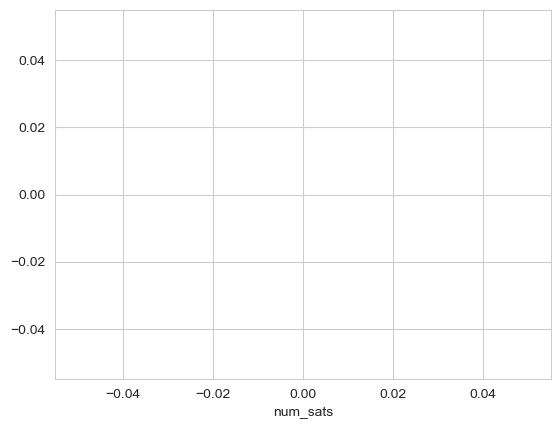

num_sats


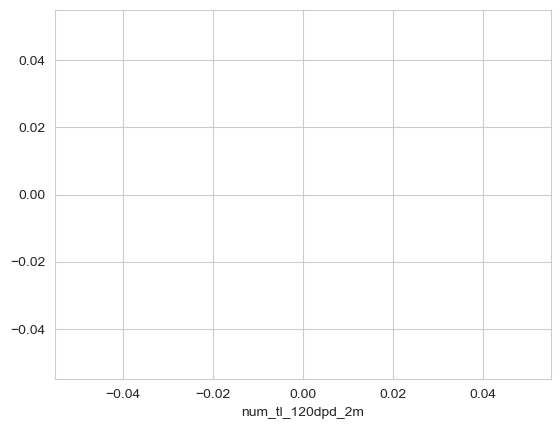

num_tl_120dpd_2m


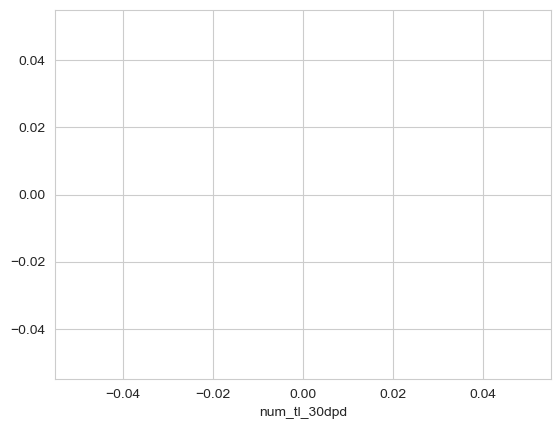

num_tl_30dpd


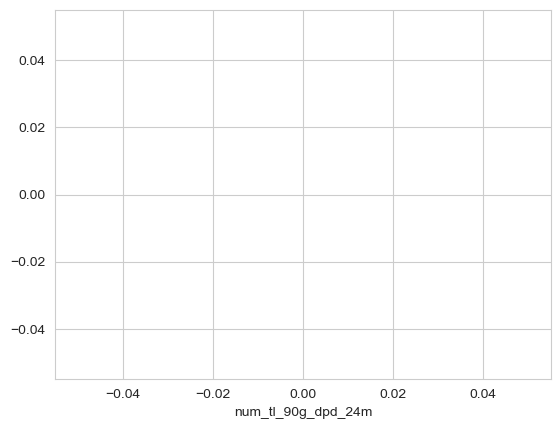

num_tl_90g_dpd_24m


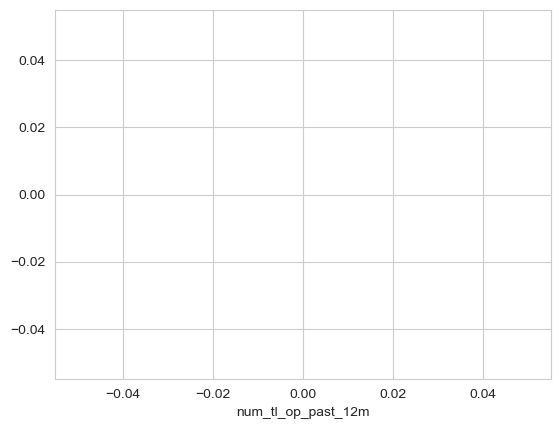

num_tl_op_past_12m


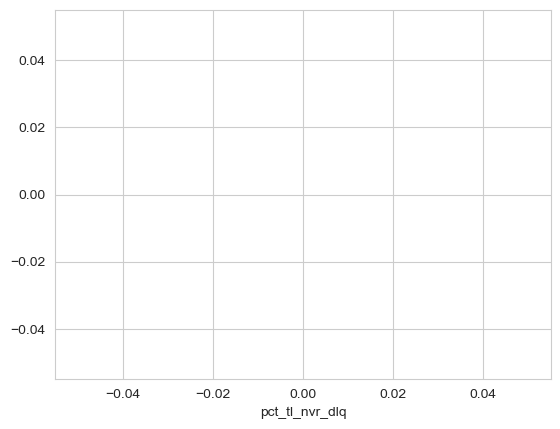

pct_tl_nvr_dlq


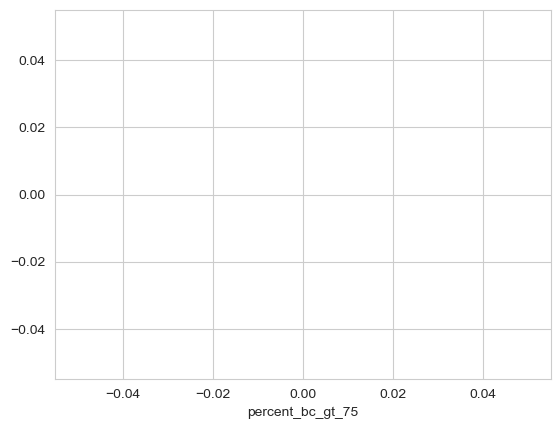

percent_bc_gt_75


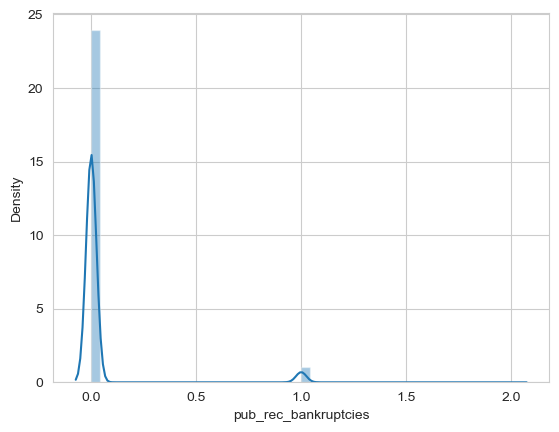

pub_rec_bankruptcies


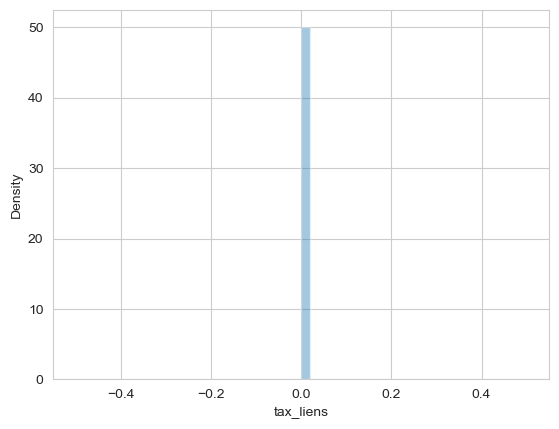

tax_liens


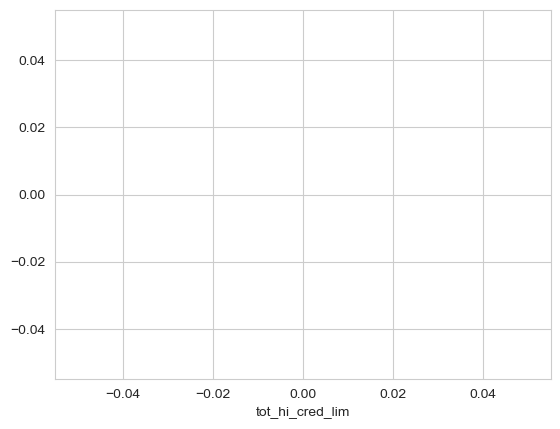

tot_hi_cred_lim


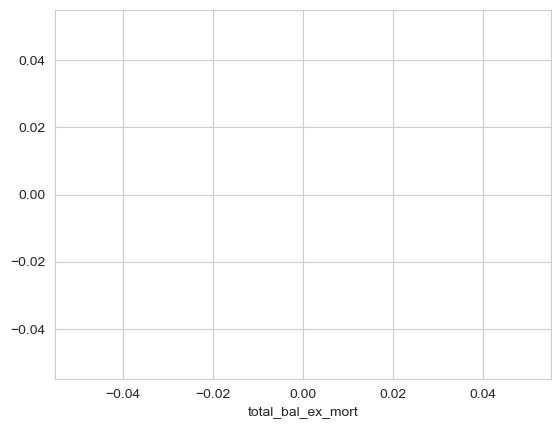

total_bal_ex_mort


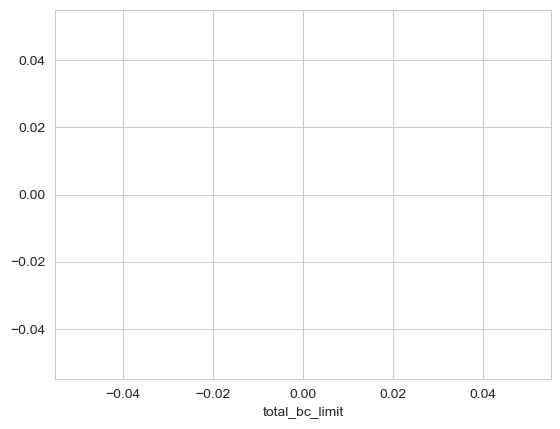

total_bc_limit


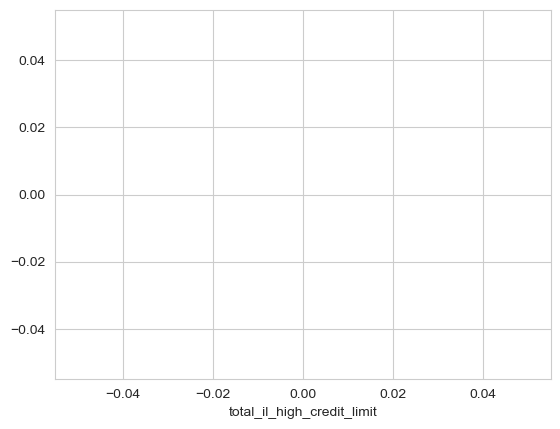

total_il_high_credit_limit


In [63]:
for i in data.columns:
    if data[i].dtype=='float64':
        sns.distplot(data[pd.notna(data[i])][i])
        plt.show()
        print(i)                                   #distplot showing the skewness of the data in columns

In [64]:
# make general plots to examine each feature
def plot_var_all(col_name, full_name, continuous):
    """
    Visualize a variable with/without faceting on the loan status.
    - col_name is the variable name in the dataframe
    - full_name is the full variable name
    - continuous is True for continuous variables
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, sharex=False, figsize=(15,3))
    # plot1: counts distribution of the variable
    
    if continuous:  
        sns.distplot(df.loc[df[col_name].notnull(), col_name], kde=False, ax=ax1)
    else:
        sns.countplot(df[col_name], order=sorted(df[col_name].unique()), color='#5975A4', saturation=1, ax=ax1)
    ax1.set_xlabel(full_name)
    ax1.set_ylabel('Count')
    ax1.set_title(full_name)

          
    # plot2: bar plot of the variable grouped by loan_status
    if continuous:
        sns.boxplot(x=col_name, y='loan_status', data=df, ax=ax2)
        ax2.set_ylabel('')
        ax2.set_title(full_name + ' by Loan Status')
    else:
        Charged_Off_rates = df.groupby(col_name)['loan_status'].value_counts(normalize=True)[:,'Charged Off']
        sns.barplot(x=Charged_Off_rates.index, y=Charged_Off_rates.values, color='#5975A4', saturation=1, ax=ax2)
        ax2.set_ylabel('Fraction of Loans Charged Off')
        ax2.set_title('Charged Off Rate by ' + full_name)
        ax2.set_xlabel(full_name)
    
    # plot3: kde Kernel Distribution plot of the variable gropued by loan_status
    if continuous:  
        facet = sns.FacetGrid(df, hue = 'loan_status', size=3, aspect=4)
        facet.map(sns.kdeplot, col_name, shade=True)
        #facet.set(xlim=(df[col_name].min(), df[col_name].max()))
        facet.add_legend()  
    else:
        fig = plt.figure(figsize=(12,3))
        sns.countplot(x=col_name, hue='loan_status', data=df, order=sorted(df[col_name].unique()) )
     
    plt.tight_layout()


In [65]:
# make general plots to examine each feature
def plot_var(col_name, full_name, continuous):
    """
    Visualize a variable with/without faceting on the loan status.
    - col_name is the variable name in the dataframe
    - full_name is the full variable name
    - continuous is True for continuous variables
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, sharex=False, figsize=(15,3))
    # plot1: counts distribution of the variable
    
    if continuous:  
        sns.distplot(df.loc[df[col_name].notnull(), col_name], kde=False, ax=ax1)
    else:
        sns.countplot(df[col_name], order=sorted(df[col_name].unique()), color='#5975A4', saturation=1, ax=ax1)
    ax1.set_xlabel(full_name)
    ax1.set_ylabel('Count')
    ax1.set_title(full_name)

          
    # plot2: bar plot of the variable grouped by loan_status
    if continuous:
        sns.boxplot(x=col_name, y='loan_condition', data=df, ax=ax2)
        ax2.set_ylabel('')
        ax2.set_title(full_name + ' by Loan Status')
    else:
        Charged_Off_rates = df.groupby(col_name)['loan_condition'].value_counts(normalize=True)[:,'Charged Off']
        sns.barplot(x=Charged_Off_rates.index, y=Charged_Off_rates.values, color='#5975A4', saturation=1, ax=ax2)
        ax2.set_ylabel('Fraction of Loans Charged Off')
        ax2.set_title('Charged Off Rate by ' + full_name)
        ax2.set_xlabel(full_name)
    
    # plot3: kde Kernel Distribution plot of the variable gropued by loan_status
    if continuous:  
        facet = sns.FacetGrid(df, hue = 'loan_condition', size=3, aspect=4)
        facet.map(sns.kdeplot, col_name, shade=True)
        #facet.set(xlim=(df[col_name].min(), df[col_name].max()))
        facet.add_legend()  
    else:
        fig = plt.figure(figsize=(12,3))
        sns.countplot(x=col_name, hue='loan_condition', data=df, order=sorted(df[col_name].unique()) )
     
    plt.tight_layout()


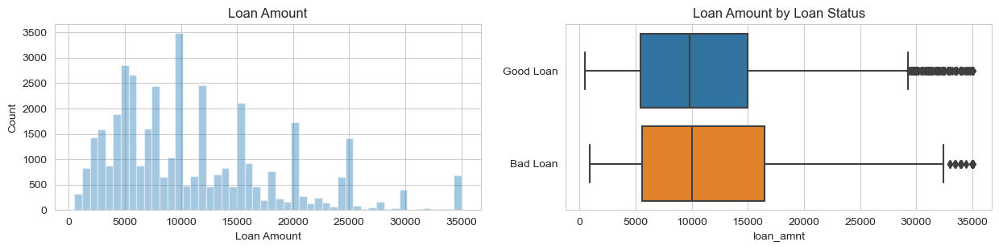

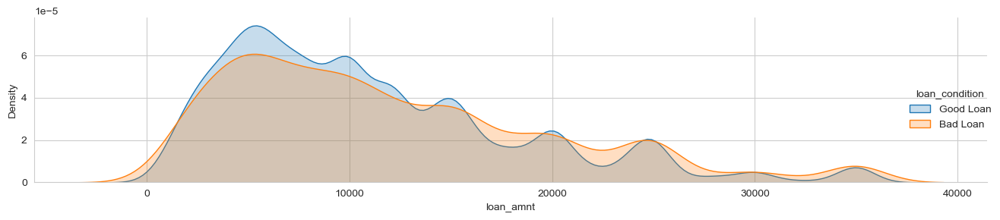

In [66]:
plot_var('loan_amnt', 'Loan Amount', continuous=True)

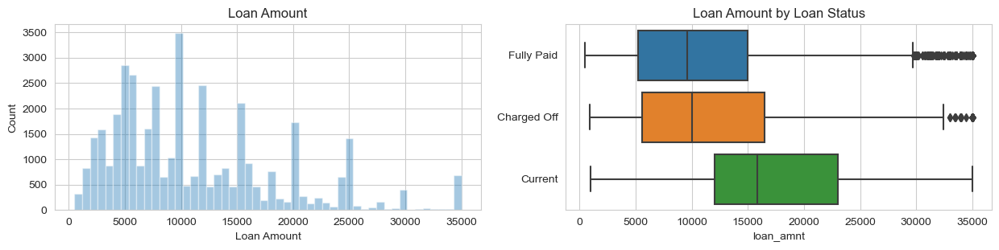

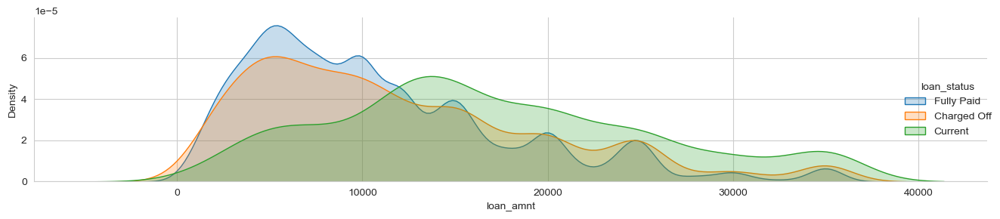

In [67]:
plot_var_all('loan_amnt', 'Loan Amount', continuous=True)

In [68]:
data['term'].sample(5)

35685     36 months
34049     36 months
15053     60 months
14998     60 months
15384     36 months
Name: term, dtype: object

In [69]:
data.term.value_counts(normalize=True)

 36 months    0.732583
 60 months    0.267417
Name: term, dtype: float64

In [70]:
data['term'] = data['term'].apply(lambda s: np.int8(s.split()[0]))

In [71]:
data['term'].head(5)

0    36
1    60
2    36
3    36
4    60
Name: term, dtype: int8

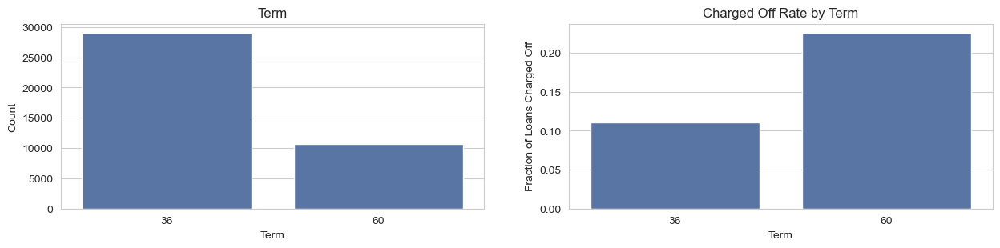

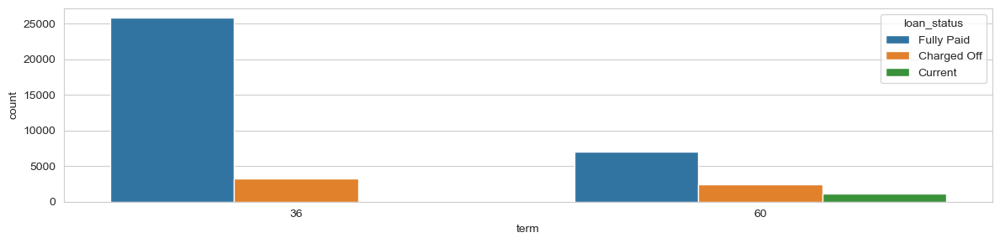

In [72]:
plot_var_all('term', 'Term', continuous=False)

ValueError: could not convert string to float: '10.65%'

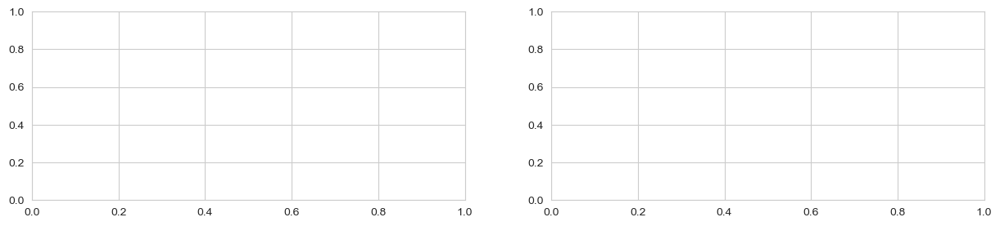

In [73]:
plot_var('int_rate', 'Interest Rate', continuous=True)

In [74]:
data['int_rate'].head(5)

0    10.65%
1    15.27%
2    15.96%
3    13.49%
4    12.69%
Name: int_rate, dtype: object

In [75]:
data['int_rate']=data['int_rate'].str.replace("%","")

In [76]:
data['int_rate'].head(5)

0    10.65
1    15.27
2    15.96
3    13.49
4    12.69
Name: int_rate, dtype: object

TypeError: Neither the `x` nor `y` variable appears to be numeric.

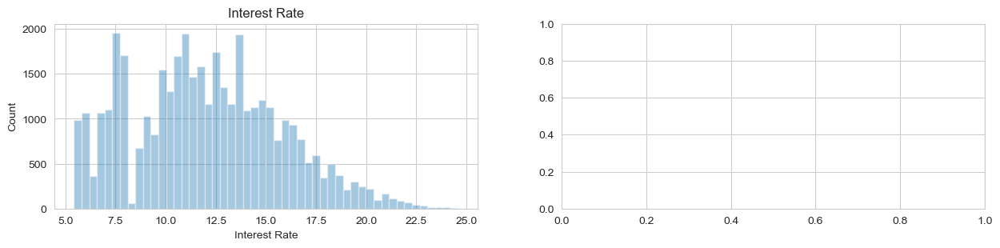

In [77]:
plot_var('int_rate', 'Interest Rate', continuous=True)

In [78]:
data.int_rate.head()

0    10.65
1    15.27
2    15.96
3    13.49
4    12.69
Name: int_rate, dtype: object

In [95]:
data['int_rate']=data['int_rate'].astype('float64')

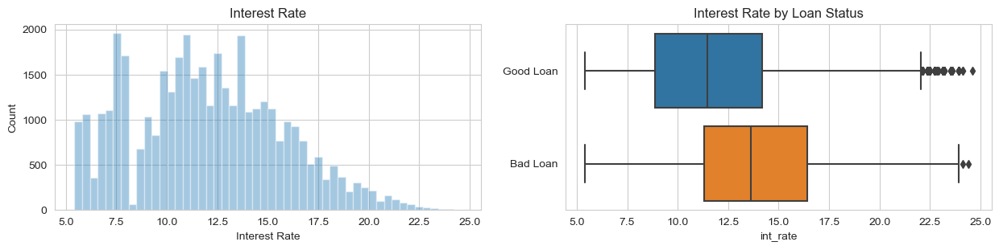

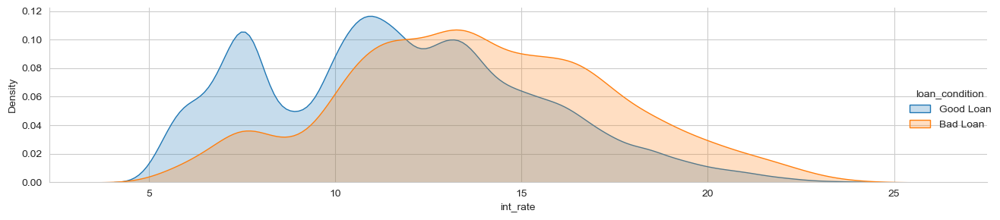

In [80]:
plot_var('int_rate', 'Interest Rate', continuous=True)

In [81]:
data['emp_length'].value_counts()

10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64

In [82]:
data['emp_length'].replace('< 1 year', '0 years', inplace=True)
data['emp_length']=loann['emp_length'].str.rstrip('+ years').astype(np.float)
data['emp_length'].fillna(0,inplace=True)
#rstrip
#lstrip
#strip

In [83]:
data.emp_length.value_counts()

10.0    8879
0.0     5658
2.0     4388
3.0     4095
4.0     3436
5.0     3282
1.0     3240
6.0     2229
7.0     1773
8.0     1479
9.0     1258
Name: emp_length, dtype: int64

In [84]:
data.shape

(39717, 111)

In [85]:
#grade, sub_grade
#Data Dictionary for grade: "assigned loan grade." Data Dictionary for sub_grade: "LC assigned loan subgrade."

#What are the possible values of grade and sub_grade?

In [86]:
sorted(data['grade'].unique())

['A', 'B', 'C', 'D', 'E', 'F', 'G']

In [87]:
print(sorted(df['sub_grade'].unique()))

['A1', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1', 'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3', 'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5']


In [88]:
#The "grade" is included in the "sub_grade" column, so it could be dropped. 

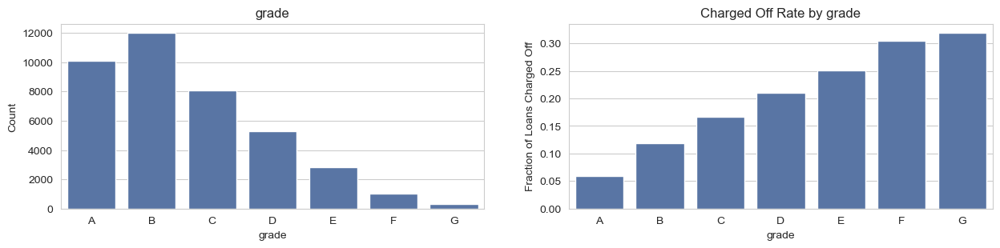

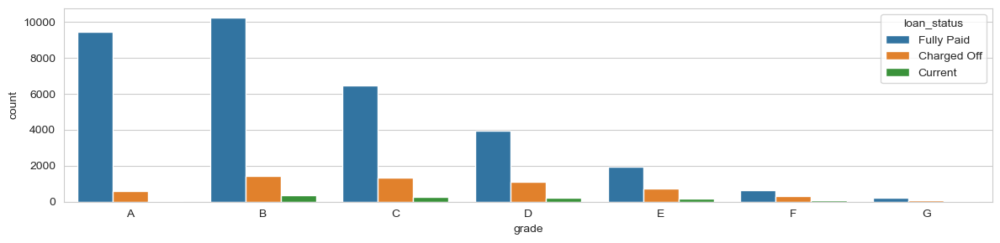

In [89]:
plot_var_all('grade','grade',continuous=False)

In [90]:
#correlation using graphical method

In [91]:
list_float = data.select_dtypes(exclude=['object']).columns

In [92]:
list_float

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'dti',
       'delinq_2yrs', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_amnt', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'verification_status_joint', 'acc_now_delinq', 'tot_coll_amt',
       'tot_cur_bal', 'open_acc_6m', 'open_il_6m', 'open_il_12m',
       'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util',
       'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util',
       'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m',
       'acc_open_past_24mths', 'avg_cur_bal', 'bc_ope

In [93]:
list_float=['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'emp_length', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'total_acc',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv']

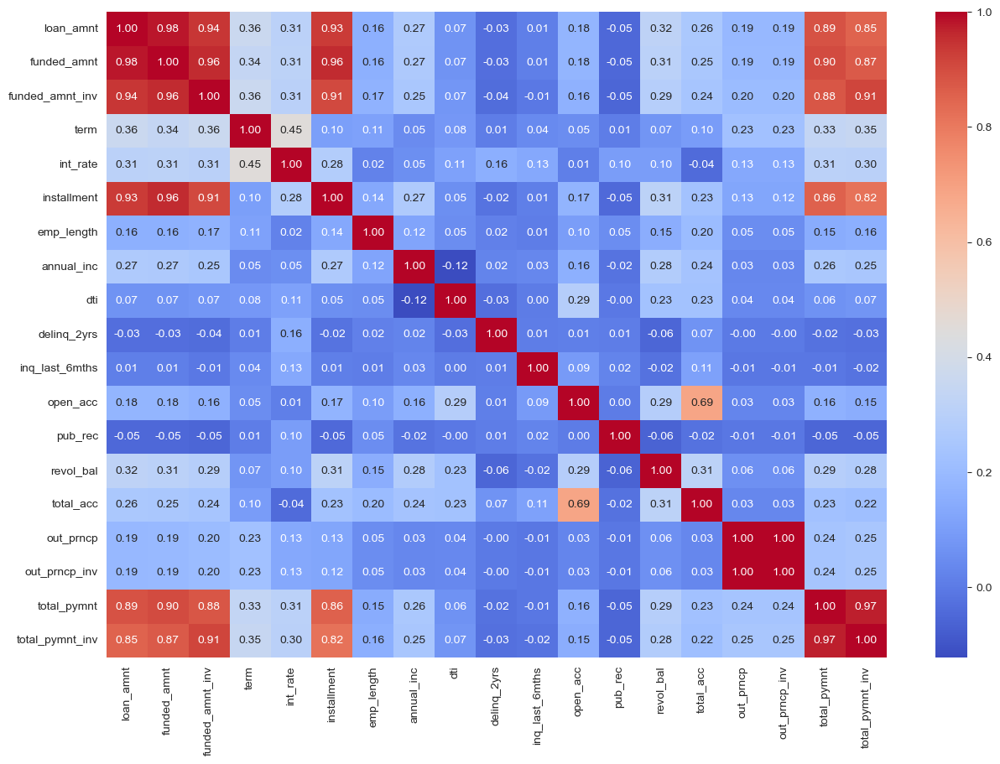

In [94]:
fig, ax = plt.subplots(figsize=(15,10))         # Sample figsize in inches
cm_df = sns.heatmap(df[list_float].corr(),annot=True, fmt = ".2f", cmap = "coolwarm", ax=ax)

In [96]:
#Data Balancing

In [97]:
data_v1=data[['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'emp_length', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'total_acc',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv','loan_condition']]

In [98]:
data_v1.loan_condition.value_counts()

Good Loan    34090
Bad Loan      5627
Name: loan_condition, dtype: int64

In [99]:
data_v1.loan_condition.value_counts(normalize=True)

Good Loan    0.858323
Bad Loan     0.141677
Name: loan_condition, dtype: float64

In [100]:
data_v1['loan_status_final']=data_v1.loan_condition
data_v1['loan_status_final'].replace("Good Loan",0,inplace=True)
data_v1['loan_status_final'].replace("Bad Loan",1,inplace=True)

In [101]:
data_v1.loan_status_final.value_counts(normalize=True)

0    0.858323
1    0.141677
Name: loan_status_final, dtype: float64

In [102]:
data_v1.loan_status_final=data_v1.loan_status_final.astype(int)

In [103]:
data_v1.loan_status_final.head()

0    0
1    1
2    0
3    0
4    0
Name: loan_status_final, dtype: int32

In [104]:
data_v1.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,loan_condition,loan_status_final
0,5000,5000,4975.0,36,10.65,162.87,10.0,24000.0,27.65,0,1,3,0,13648,9,0.00,0.00,5863.155187,5833.84,Good Loan,0
1,2500,2500,2500.0,60,15.27,59.83,0.0,30000.0,1.00,0,5,3,0,1687,4,0.00,0.00,1008.710000,1008.71,Bad Loan,1
2,2400,2400,2400.0,36,15.96,84.33,10.0,12252.0,8.72,0,2,2,0,2956,10,0.00,0.00,3005.666844,3005.67,Good Loan,0
3,10000,10000,10000.0,36,13.49,339.31,10.0,49200.0,20.00,0,1,10,0,5598,37,0.00,0.00,12231.890000,12231.89,Good Loan,0
4,3000,3000,3000.0,60,12.69,67.79,1.0,80000.0,17.94,0,0,15,0,27783,38,524.06,524.06,3513.330000,3513.33,Good Loan,0


In [105]:
data_v1.drop('loan_condition',axis=1,inplace=True)

In [ ]:
#data_v1['term'] = data_v1['term'].apply(lambda s: np.int8(s.split()[0]))

In [106]:
nulls = pd.DataFrame(round(data_v1.isnull().sum()/len(data_v1.index)*100,2),columns=['null_percent'])
null=nulls[nulls['null_percent']!=0.00].sort_values('null_percent',ascending=False)
df2 = pd.DataFrame(index=nulls.index.copy())
df2[['null_percent']]=nulls[['null_percent']]
df2.sort_values(['null_percent'],ascending=False)

,null_percent
loan_amnt,0.0
funded_amnt,0.0
total_pymnt_inv,0.0
total_pymnt,0.0
out_prncp_inv,0.0
out_prncp,0.0
total_acc,0.0
revol_bal,0.0
pub_rec,0.0
open_acc,0.0


In [107]:
#data_v1.drop('emp_length',axis=1,inplace=True)

In [108]:
data_v1.dti.fillna(data_v1.dti.median(),inplace=True)

In [109]:
X = data_v1.drop('loan_status_final', axis = 1)
Y = data_v1.loan_status_final
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE 
# sm = SMOTE(random_state=42)
# X_res, y_res = sm.fit_resample(X, Y)
# X=pd.DataFrame(X_res,columns=X.columns)
# Y=pd.Series(y_res)
# Y= Y.to_frame('loan_condition')

ModuleNotFoundError: No module named 'imblearn'

In [110]:
m = SMOTE(random_state=42)

NameError: name 'SMOTE' is not defined

In [111]:
X_res, y_res = m.fit_resample(X, Y)

NameError: name 'm' is not defined

In [112]:
X=pd.DataFrame(X_res,columns=X.columns)
Y=pd.Series(y_res)
Y= Y.to_frame('loan_status_final')

NameError: name 'X_res' is not defined

In [113]:
Y.loan_status_final.value_counts()

AttributeError: 'Series' object has no attribute 'loan_status_final'

In [114]:
Y.loan_status_final.value_counts(normalize=True)

AttributeError: 'Series' object has no attribute 'loan_status_final'